<a href="https://colab.research.google.com/github/lax-17/Fmri-to-image/blob/main/cDCGAN_with_LSGAN_Loss_(N%3D1024_PCA).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Baseline GAN model for assessment

**Module:** Deep Neural Networks and Learning Systems

In this demonstration and notebook, we will develop a baseline model for your assessment task.


---


**Objectives:**

- Develop the baseline convolutional GAN
- Understand the potential modifications to this model to be performed as an assessment

## Setting up the dataset

The dataset is located in a different drive (public). Therefore, we need to add a shortcut to the data directory in our own drive.

**Original dataset**

Open the dataset external drive: [https://drive.google.com/drive/folders/1DUf3nGNNFk6YjRjQtZPfAY5N105GoGJb](https://drive.google.com/drive/folders/1DUf3nGNNFk6YjRjQtZPfAY5N105GoGJb) and click in add shortcut.


## Utility functions

The following functions can be used to load the FMRI data from a given subject, load activity from a given region of interest or loading the corresponding image.

In [ ]:
# Core libraries
import os, glob, joblib, shutil
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.decomposition import PCA

import time
import random
import imageio
import re

# PyTorch related
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils # For saving image grids


# Check device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


In [ ]:
!pip install kaggle==1.5.16
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!echo '{"username":"laxmikantnishad","key":"8df23e284cea717789d6c9775e0da3ae"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d laxmikantnishad/algonauts-2023-tutorial-data
!unzip /content/algonauts-2023-tutorial-data.zip -d /content/algonauts_2023_tutorial_data

## Loading Data


In [ ]:

# root_dir = '/content/algonauts_2023_tutorial_data'
# algonauts_dir = 'algonauts_2023_tutorial_Data'

root_dir = '/content/drive/MyDrive/Assesment/Dataset'
algonauts_dir = 'algonauts_2023_tutorial_data'
 # Path to the shortcut in your drive
algonauts_path = os.path.join(root_dir, algonauts_dir)

In [ ]:
# @title Helper functions
# Loads all the fmri data associated to a given subject
def load_fmri_of_subject( subj, hemisphere, directory = root_dir ):
  subj = subj # Subject
  hemisphere = hemisphere # Which side of the brain
  # Listing directory
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
  fmri_dir = os.path.join(data_dir, 'training_split', 'training_fmri') # Location the brain activation
  # Here we load the data
  if hemisphere == 'left':
    brain_activity = np.load(os.path.join(fmri_dir, 'lh_training_fmri.npy'))
  else:
    brain_activity = np.load(os.path.join(fmri_dir, 'rh_training_fmri.npy'))
  return brain_activity

# Loads the data associated to a specific part of the brain (Some will be empty, it varies by subject)
def load_fmri_region_of_interest( subj, roi, hemisphere, directory = root_dir):
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
    # Define the ROI class based on the selected ROI
  if roi in ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"]:
      roi_class = 'prf-visualrois'
  elif roi in ["EBA", "FBA-1", "FBA-2", "mTL-bodies"]:
      roi_class = 'floc-bodies'
  elif roi in ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"]:
      roi_class = 'floc-faces'
  elif roi in ["OPA", "PPA", "RSC"]:
      roi_class = 'floc-places'
  elif roi in ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]:
      roi_class = 'floc-words'
  elif roi in ["early", "midventral", "midlateral", "midparietal", "ventral", "lateral", "parietal"]:
      roi_class = 'streams'

  # Loading the roi masks (To locate the activations of a given region)
  roi_class_dir = os.path.join(data_dir, 'roi_masks',
      hemisphere[0]+'h.'+roi_class+'_challenge_space.npy')
  roi_map_dir = os.path.join(data_dir, 'roi_masks',
      'mapping_'+roi_class+'.npy')
  roi_class_idx = np.load(roi_class_dir)
  roi_map = np.load(roi_map_dir, allow_pickle=True).item()
  roi_mapping = list(roi_map.keys())[list(roi_map.values()).index(roi)]
  challenge_roi = np.asarray(roi_class_idx == roi_mapping, dtype=int)

  # Selection the appropriate data
  fmri_dir = os.path.join(data_dir, 'training_split', 'training_fmri') # Location the brain activation
  # Here we load the data
  if hemisphere == 'left':
    brain_activity = np.load(os.path.join(fmri_dir, 'lh_training_fmri.npy'))
  else:
    brain_activity = np.load(os.path.join(fmri_dir, 'rh_training_fmri.npy'))

  fmri_roi_data = brain_activity[:,np.where(challenge_roi)[0]]

  return fmri_roi_data

# Load a particular image from a subject
def load_image_subject( subj, img, directory = root_dir):
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
  train_img_dir  = os.path.join(data_dir, 'training_split', 'training_images')
  test_img_dir  = os.path.join(data_dir, 'test_split', 'test_images')
  train_img_list = os.listdir(train_img_dir)
  train_img_list.sort()
  test_img_list = os.listdir(test_img_dir)
  test_img_list.sort()

  img_dir = os.path.join(train_img_dir, train_img_list[img])
  train_img = Image.open(img_dir).convert('RGB') # Image library (PIL)
  return train_img

def showImage( ax, image, title = '' ):
  ''' This is a helper function that allows you to show the results of your training '''
  image = (image - torch.min(image))/(torch.max(image)-torch.min(image)) # image 0...1
  ax.imshow(image.permute(1,2,0)) # You need reorganize the dimension (3, H,  W) -> (H, W, 3)
  ax.set_title(title)


## Bulding Dataset


Loading WHOLE HEMISPHERE fMRI data and computing PCA from scratch...
Loading full left hemisphere fMRI data for subject 1...
Loaded raw data shape: (9841, 19004)
Fitting PCA (1024 components)... (WARNING: May be RAM intensive!)
PCA fitting complete. Output shape: (9841, 1024)
Saving PCA model to /content/drive/MyDrive/DNN experiments/pca512SNGAN/cdcgan_pca_whole_hemi_1024/pca_1024.joblib
Saving fMRI latent matrix to /content/drive/MyDrive/DNN experiments/pca512SNGAN/cdcgan_pca_whole_hemi_1024/fmri_pca_1024.npy
Instantiating dataset with preloading...
Preloading 9841 images...


Loading images:   0%|          | 0/9841 [00:00<?, ?it/s]

Stacked images.
Finished preloading 9841 images in 137.63s.
Dataset instantiated.
Setting num_workers to 0 due to preloading.
Dataset and DataLoader created. Num samples: 9841
Sample batch shapes: Image: torch.Size([32, 3, 64, 64]) fMRI PCA: torch.Size([32, 1024])


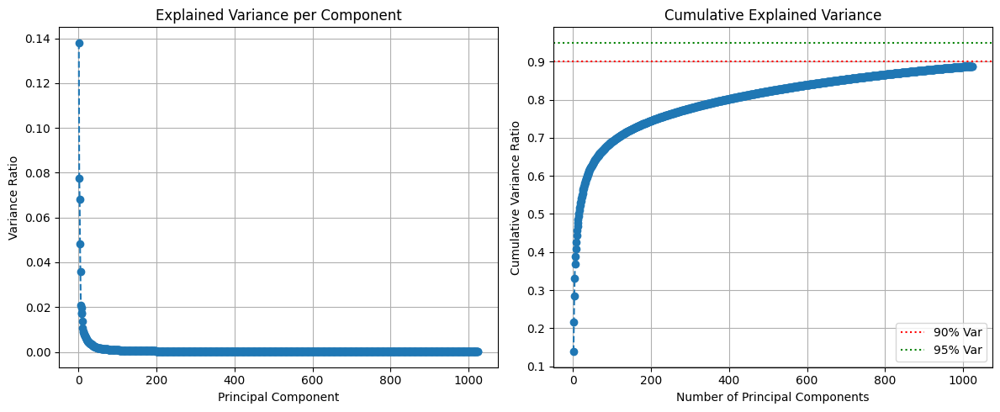

Total variance explained by 1024 components: 88.86%


In [ ]:
# Data Preparation (Increased PCA Components)

TARGET_SUBJECT = 1
TARGET_HEMISPHERE = 'left'
IMAGE_SIZE = 64

N_COMPONENTS = 1024

BATCH_SIZE = 32
NUM_WORKERS = 0

img_transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])


PCA_SAVE_DIR = f'/content/drive/MyDrive/DNN experiments/pca512SNGAN/cdcgan_pca_whole_hemi_{N_COMPONENTS}' # <<< NEW DIR NAME
PCA_MODEL_PATH = os.path.join(PCA_SAVE_DIR, f'pca_{N_COMPONENTS}.joblib')
FMRI_LATENT_PATH = os.path.join(PCA_SAVE_DIR, f'fmri_pca_{N_COMPONENTS}.npy')

RAW_DATA_DIR = '/content/drive/MyDrive/DNN experiments/pca512SNGAN/cdcgan_pca_whole_hemi' # <<< Point to where raw was saved
HEMI_DATA_RAW_PATH = os.path.join(RAW_DATA_DIR, f'fmri_{TARGET_HEMISPHERE}_hemi_raw.npy')

os.makedirs(PCA_SAVE_DIR, exist_ok=True)

fmri_pca_components = None
fmri_raw_data_np = None
pca = None

# Try loading precomputed PCA results for the specific N_COMPONENTS
if os.path.exists(PCA_MODEL_PATH) and os.path.exists(FMRI_LATENT_PATH):
    print(f"Loading existing PCA model and fMRI latent matrix for {N_COMPONENTS} components...")
    pca = joblib.load(PCA_MODEL_PATH)
    fmri_pca_components = np.load(FMRI_LATENT_PATH)
    print(f"Loaded PCA components shape: {fmri_pca_components.shape}")
# Try loading precomputed raw data and run PCA
elif os.path.exists(HEMI_DATA_RAW_PATH):
    print(f"Loading existing raw WHOLE HEMISPHERE fMRI data...")
    fmri_raw_data_np = np.load(HEMI_DATA_RAW_PATH)
    print(f"Loaded raw hemisphere fMRI data shape: {fmri_raw_data_np.shape}")
    print(f"Fitting PCA ({N_COMPONENTS} components)... (WARNING: May be RAM intensive!)")
    try:
        pca = PCA(n_components=N_COMPONENTS, whiten=True, random_state=42)
        fmri_pca_components = pca.fit_transform(fmri_raw_data_np)
        print(f"PCA fitting complete. Output shape: {fmri_pca_components.shape}")
        print(f"Saving PCA model to {PCA_MODEL_PATH}")
        print(f"Saving fMRI latent matrix to {FMRI_LATENT_PATH}")
        joblib.dump(pca, PCA_MODEL_PATH)
        np.save(FMRI_LATENT_PATH, fmri_pca_components)
    except MemoryError as e:
         print(f"ERROR: MemoryError during PCA fitting for {N_COMPONENTS} components. Try fewer components or a machine with more RAM.")
         fmri_pca_components = None
    except Exception as e:
         print(f"Error during PCA fitting: {e}")
         fmri_pca_components = None

else:
    print("Loading WHOLE HEMISPHERE fMRI data and computing PCA from scratch...")
    try:
        # ... (Code to load fmri_hemi_data_np using load_fmri_of_subject - same as before) ...
        print(f"Loading full {TARGET_HEMISPHERE} hemisphere fMRI data for subject {TARGET_SUBJECT}...")
        if 'root_dir' not in globals() or 'algonauts_dir' not in globals(): raise NameError("Paths missing.")
        fmri_raw_data_np = load_fmri_of_subject(TARGET_SUBJECT, TARGET_HEMISPHERE, directory=root_dir)
        if fmri_raw_data_np is None or fmri_raw_data_np.size == 0: raise ValueError("Failed to load fMRI data.")
        print(f"Loaded raw data shape: {fmri_raw_data_np.shape}")
        # Fit PCA
        print(f"Fitting PCA ({N_COMPONENTS} components)... (WARNING: May be RAM intensive!)")
        pca = PCA(n_components=N_COMPONENTS, whiten=True, random_state=42)
        fmri_pca_components = pca.fit_transform(fmri_raw_data_np)
        print(f"PCA fitting complete. Output shape: {fmri_pca_components.shape}")
        # Save PCA model and transformed data
        print(f"Saving PCA model to {PCA_MODEL_PATH}")
        print(f"Saving fMRI latent matrix to {FMRI_LATENT_PATH}")
        joblib.dump(pca, PCA_MODEL_PATH)
        np.save(FMRI_LATENT_PATH, fmri_pca_components)
    except (ValueError, FileNotFoundError, IndexError, MemoryError, NameError) as e:
        print(f"Error during data loading or PCA: {e}")
        fmri_pca_components = None



class FMRI_Image_PCA_Dataset(Dataset):
    def __init__(self, subject, fmri_pca_data, transform=None):
        self.subject = subject
        self.fmri_pca = torch.from_numpy(fmri_pca_data).float()
        self.transform = transform
        self.num_samples = fmri_pca_data.shape[0]
        self.images = []
        print(f"Preloading {self.num_samples} images..."); T_start=time.time()
        for idx in tqdm(range(self.num_samples), desc="Loading images"): # Use standard tqdm here
            img = load_image_subject(self.subject, idx, directory=root_dir);
            if img is None: img = torch.zeros((3, IMAGE_SIZE, IMAGE_SIZE))
            elif self.transform: img = self.transform(img)
            else: img = transforms.ToTensor()(img)
            self.images.append(img)
        try: self.images = torch.stack(self.images); print("Stacked images.")
        except: print("Keeping images as list.")
        print(f"Finished preloading {len(self.images)} images in {time.time()-T_start:.2f}s.")
    def __len__(self): return self.num_samples
    def __getitem__(self, idx): return self.images[idx], self.fmri_pca[idx]



dataset = None
dataloader = None
if fmri_pca_components is not None:

    print("Instantiating dataset with preloading...")
    try:
        dataset = FMRI_Image_PCA_Dataset(TARGET_SUBJECT, fmri_pca_components, transform=img_transform)
        print("Dataset instantiated.")
        print(f"Setting num_workers to {NUM_WORKERS} due to preloading.")
        dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True if torch.cuda.is_available() else False)
        print(f"Dataset and DataLoader created. Num samples: {len(dataset)}")
        img_batch, fmri_batch = next(iter(dataloader))
        print("Sample batch shapes: Image:", img_batch.shape, "fMRI PCA:", fmri_batch.shape)
    except Exception as e: print(f"Error creating Dataset/DataLoader: {e}"); dataset=None; dataloader=None
else:
    print("Dataset/DataLoader creation skipped due to PCA errors.")

# --- Plot Explained Variance ---
if pca is not None and fmri_pca_components is not None:
    explained_variance = pca.explained_variance_ratio_
    cumulative_explained_variance = np.cumsum(explained_variance)
    plt.figure(figsize=(12, 5)); plt.subplot(1, 2, 1); plt.plot(range(1, N_COMPONENTS + 1), explained_variance, marker='o', linestyle='--'); plt.title('Explained Variance per Component'); plt.xlabel('Principal Component'); plt.ylabel('Variance Ratio'); plt.grid(True); plt.subplot(1, 2, 2); plt.plot(range(1, N_COMPONENTS + 1), cumulative_explained_variance, marker='o', linestyle='--'); plt.title('Cumulative Explained Variance'); plt.xlabel('Number of Principal Components'); plt.ylabel('Cumulative Variance Ratio'); plt.axhline(y=0.9, color='r', linestyle=':', label='90% Var'); plt.axhline(y=0.95, color='g', linestyle=':', label='95% Var'); plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()
    print(f"Total variance explained by {N_COMPONENTS} components: {cumulative_explained_variance[-1]*100:.2f}%")
else:
    print("PCA object or components not available for plotting.")

## Models cDCGAN

In [ ]:
#  Model Definitions (cDCGAN Adjusted for PCA Components)

try:
    if 'N_COMPONENTS' not in globals(): raise NameError("N_COMPONENTS not defined (run Cell 3)")
    fMRI_dim = N_COMPONENTS # Set input dim based on PCA
    embedding_dim = 128    # Dimension for embedded condition
    nz = 100               # Size of generator noise input
    ngf = 64               # Gen feature map size
    ndf = 64               # Disc feature map size
    nc = 3                 # Image channels
    print(f"Defining models with fMRI_dim={fMRI_dim}, embedding_dim={embedding_dim}, nz={nz}, ngf={ngf}, ndf={ndf}, nc={nc}")
except NameError as e:
     print(f"ERROR: Parameter missing: {e}")
     fMRI_dim=256; embedding_dim=128; nz=100; ngf=64; ndf=64; nc=3

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1: nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1: nn.init.normal_(m.weight.data, 1.0, 0.02); nn.init.constant_(m.bias.data, 0)
    elif classname.find('Linear') != -1: nn.init.normal_(m.weight.data, 0.0, 0.02);
    if hasattr(m, 'bias') and m.bias is not None: nn.init.constant_(m.bias.data, 0)

# --- Generator (DCGAN Style) ---
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.fMRI_embed = nn.Linear(fMRI_dim, embedding_dim) # Takes PCA components
        combined_input_dim = nz + embedding_dim
        self.main = nn.Sequential(
            nn.ConvTranspose2d(combined_input_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8), nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4), nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2), nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf), nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, noise, fmri_condition):
        fmri_embedded = self.fMRI_embed(fmri_condition)
        gen_input = torch.cat((noise, fmri_embedded), 1)
        gen_input_reshaped = gen_input.unsqueeze(-1).unsqueeze(-1)
        return self.main(gen_input_reshaped)

# --- Discriminator (DCGAN Style, NO Sigmoid for LSGAN) ---
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.fMRI_embed = nn.Sequential(
            nn.Linear(fMRI_dim, embedding_dim), # Takes PCA components
            nn.LeakyReLU(0.2, inplace=True) # Added activation
        )
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False), nn.LeakyReLU(0.2, inplace=True),
            # Concatenate condition after first layer -> ndf + embedding_dim channels
            nn.Conv2d(ndf + embedding_dim, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False) # Output raw score
            # No Sigmoid
        )

    def forward(self, image, fmri_condition):
        img_feat_32 = self.main[0](image)
        img_feat_32 = self.main[1](img_feat_32)
        fmri_embedded = self.fMRI_embed(fmri_condition)
        fmri_spatial = fmri_embedded.unsqueeze(-1).unsqueeze(-1).expand(-1, -1, 32, 32)
        combined = torch.cat((img_feat_32, fmri_spatial), 1)
        output = combined
        for layer in self.main[2:]: output = layer(output)
        return output.view(-1) # Return raw scores

# --- Instantiate Models ---
netG = None; netD = None; models_defined = False
try:
    netG = Generator().to(device)
    netD = Discriminator().to(device)
    netG.apply(weights_init)
    netD.apply(weights_init)
    print("--- Generator (DCGAN Style) ---")
    # print(netG)
    print("--- Discriminator (DCGAN Style for LSGAN) ---")
    # print(netD)
    print("DCGAN-based Conditional Models defined for LSGAN.")
    models_defined = True
except NameError as e: print(f"ERROR: Required parameters not defined: {e}")
except Exception as e: print(f"Error during model instantiation: {e}")

Defining models with fMRI_dim=1024, embedding_dim=128, nz=100, ngf=64, ndf=64, nc=3
--- Generator (DCGAN Style) ---
--- Discriminator (DCGAN Style for LSGAN) ---
DCGAN-based Conditional Models defined for LSGAN.


## Training for 1000 epochs

### Training setup

In [ ]:
# Check device again
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Confirming device: {device}")

# Check if previous steps were successful
if 'dataloader' not in locals() or dataloader is None:
     print("ERROR: DataLoader not found. Please run Cell 3 successfully first.")
     ready_to_train = False
elif 'models_defined' not in locals() or not models_defined:
     print("ERROR: Generator (netG) or Discriminator (netD) not defined. Please run Cell 4 successfully first.")
     ready_to_train = False
else:
    ready_to_train = True

if ready_to_train:
    NUM_EPOCHS = 1000
    LR_G = 0.0002
    LR_D = 0.0001
    WEIGHT_DECAY = 0
    BETA1 = 0.5

    OUTPUT_BASE_DIR = f'/content/drive/MyDrive/DNN experiments/pca512SNGAN{N_COMPONENTS}' # <<< Folder name reflects PCA components
    PREVIEW_DIR_LSGAN = os.path.join(OUTPUT_BASE_DIR, 'previews')
    CHECKPOINT_DIR_LSGAN = os.path.join(OUTPUT_BASE_DIR, 'checkpoints')
    LOSS_CURVE_G_PATH = os.path.join(OUTPUT_BASE_DIR, 'g_losses.npy')
    LOSS_CURVE_D_PATH = os.path.join(OUTPUT_BASE_DIR, 'd_losses.npy')
    REAL_SAMPLES_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_samples_for_preview.png')
    FIXED_NOISE_PATH = os.path.join(OUTPUT_BASE_DIR, 'fixed_noise.pt')
    FIXED_FMRI_PATH = os.path.join(OUTPUT_BASE_DIR, 'fixed_fmri_condition.pt')
    REAL_IMAGES_PREVIEW_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_images_preview.pt')

    os.makedirs(PREVIEW_DIR_LSGAN, exist_ok=True)
    os.makedirs(CHECKPOINT_DIR_LSGAN, exist_ok=True)
    print(f"Outputs will be saved to: {OUTPUT_BASE_DIR}")


    PREVIEW_EVERY = 20
    CHECKPOINT_EVERY = 100

    fixed_noise = None; fixed_fmri_condition = None; real_images_for_preview = None
    try:
        if BATCH_SIZE != dataloader.batch_size:
             print(f"Recreating dataloader with batch size: {BATCH_SIZE}")
             dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True if device.type == 'cuda' else False)

        fixed_real_batch, fixed_fmri_batch = next(iter(dataloader))
        preview_batch_size = min(BATCH_SIZE, 16)
        fixed_noise = torch.randn(preview_batch_size, nz, device=device)
        fixed_fmri_condition = fixed_fmri_batch[:preview_batch_size].to(device)
        real_images_for_preview = fixed_real_batch[:preview_batch_size]
        print(f"Using fixed fMRI conditions (shape: {fixed_fmri_condition.shape}) for previews (Batch Size: {BATCH_SIZE})")
        if not os.path.exists(REAL_SAMPLES_PATH): vutils.save_image(real_images_for_preview * 0.5 + 0.5, REAL_SAMPLES_PATH, normalize=False, padding=2); print(f"Saved real samples.")
        else: print(f"Real samples file exists.")
        # Save fixed tensors
        torch.save(fixed_noise, FIXED_NOISE_PATH); torch.save(fixed_fmri_condition, FIXED_FMRI_PATH); torch.save(real_images_for_preview, REAL_IMAGES_PREVIEW_PATH)
        print(f"Saved fixed tensors for visualization.")
    except Exception as e: print(f"Warning: Could not set fixed batch: {e}"); ready_to_train = False # Stop if we can't get preview data

    # --- Labels & Loss (FOR LSGAN) ---
    real_label_val = 1.0
    fake_label_val = 0.0
    criterion = nn.MSELoss() # Use MSELoss for LSGAN
    print("Using MSELoss (LSGAN)")

    # --- Optimizers ---
    optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(BETA1, 0.999), weight_decay=WEIGHT_DECAY)
    optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(BETA1, 0.999), weight_decay=WEIGHT_DECAY)
    print(f"Optimizers initialized with LR_G={LR_G}, LR_D={LR_D}")

    # --- Loss Tracking ---
    img_list = []
    G_losses_iter = [] # Changed to iter losses
    D_losses_iter = []

    print("Training setup complete.")

else:
    print("ERROR: Cannot proceed with setup.")

Confirming device: cuda:0
Outputs will be saved to: /content/drive/MyDrive/DNN experiments/pca512SNGAN1024
Using fixed fMRI conditions (shape: torch.Size([16, 1024])) for previews (Batch Size: 32)
Saved real samples.
Saved fixed tensors for visualization.
Using MSELoss (LSGAN)
Optimizers initialized with LR_G=0.0002, LR_D=0.0001
Training setup complete.


In [ ]:
# Training Loop (LSGAN + Higher PCA)

if 'ready_to_train' in locals() and ready_to_train and fixed_fmri_condition is not None:
    print(f"Starting LSGAN Training Loop for {NUM_EPOCHS} epochs...")
    iters = 0
    start_time = time.time()
    final_epoch = 0

    # Initialize or load loss lists
    if 'G_losses_iter' not in locals() or ('epoch' in locals() and epoch == 1): G_losses_iter = []
    if 'D_losses_iter' not in locals() or ('epoch' in locals() and epoch == 1): D_losses_iter = []
    if 'img_list' not in locals() or ('epoch' in locals() and epoch == 1): img_list = []

    for epoch in range(1, NUM_EPOCHS + 1):
        epoch_start_time = time.time()
        netG.train()
        netD.train()
        final_epoch = epoch
        epoch_g_loss_accum = 0.0
        epoch_d_loss_accum = 0.0
        valid_g_iters = 0
        valid_d_iters = 0

        progress_bar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch}/{NUM_EPOCHS}")

        for i, data in progress_bar:
            # --- (1) Update Discriminator ---
            netD.zero_grad()
            real_img = data[0].to(device)
            fmri_cond = data[1].to(device)
            b_size = real_img.size(0)

            label_real = torch.full((b_size,), real_label_val, dtype=torch.float, device=device) # Target 1.0
            label_fake = torch.full((b_size,), fake_label_val, dtype=torch.float, device=device) # Target 0.0

            # Real batch pass
            output_real = netD(real_img, fmri_cond)
            errD_real = criterion(output_real, label_real) # MSE(D(x), 1)
            if torch.isfinite(errD_real): errD_real.backward()
            else: print(f"W: NaN/Inf D_real e:{epoch} i:{i}"); errD_real = torch.tensor(0.0)
            D_x = output_real.mean().item() # Not probability, but score distance from 1

            # Fake batch pass
            noise = torch.randn(b_size, nz, device=device)
            fake = netG(noise, fmri_cond)
            output_fake = netD(fake.detach(), fmri_cond)
            errD_fake = criterion(output_fake, label_fake) # MSE(D(G(z)), 0)
            if torch.isfinite(errD_fake): errD_fake.backward()
            else: print(f"W: NaN/Inf D_fake e:{epoch} i:{i}"); errD_fake = torch.tensor(0.0)

            errD = errD_real + errD_fake # LSGAN D loss often uses 0.5 * (errD_real + errD_fake)
            # errD = 0.5 * (errD_real + errD_fake) # Optional scaling
            if torch.isfinite(errD): optimizerD.step()
            else: print(f"W: Skip D step e:{epoch} i:{i}")


            # --- (2) Update Generator ---
            netG.zero_grad()
            label_g = torch.full((b_size,), real_label_val, dtype=torch.float, device=device) # G targets 1.0
            output_g = netD(fake, fmri_cond) # Use non-detached fake
            errG = criterion(output_g, label_g) # MSE(D(G(z)), 1)
            if torch.isfinite(errG):
                 epoch_g_loss_accum += errG.item()
                 valid_g_iters += 1
                 errG.backward()
                 optimizerG.step()
                 G_losses_iter.append(errG.item())
            else:
                 print(f"W: NaN/Inf G e:{epoch} i:{i}")
                 G_losses_iter.append(float('nan'))

            D_G_z1 = output_fake.mean().item() # Score distance from 0
            D_G_z2 = output_g.mean().item()    # Score distance from 1 (after G update)

            # Accumulate D loss for epoch average
            if torch.isfinite(errD):
                 epoch_d_loss_accum += errD.item()
                 valid_d_iters += 1
                 D_losses_iter.append(errD.item()) # Store combined D loss for iteration plot
            else:
                  D_losses_iter.append(float('nan'))


            if i % 100 == 0: # Logging
                 progress_bar.set_postfix({
                    'Loss_D': f'{errD.item():.4f}' if torch.isfinite(errD) else 'NaN',
                    'Loss_G': f'{errG.item():.4f}' if torch.isfinite(errG) else 'NaN',
                })
            iters += 1

        # --- Epoch End ---
        loader_len = len(dataloader)
        avg_epoch_loss_g = epoch_g_loss_accum / valid_g_iters if valid_g_iters > 0 else 0.0
        avg_epoch_loss_d = epoch_d_loss_accum / valid_d_iters if valid_d_iters > 0 else 0.0
        epoch_time = time.time() - epoch_start_time
        print(f'\nEpoch [{epoch}/{NUM_EPOCHS}] finished in {epoch_time:.2f}s. Avg Losses -> G: {avg_epoch_loss_g:.4f}, D: {avg_epoch_loss_d:.4f}')

        # --- Checkpoint Saving (Models AND Losses) ---
        if epoch % CHECKPOINT_EVERY == 0 or epoch == NUM_EPOCHS:
            # ... (Save checkpoints and iteration loss arrays as before, using CHECKPOINT_DIR_LSGAN etc) ...
             ckpt_path_g = os.path.join(CHECKPOINT_DIR_LSGAN, f'netG_epoch_{epoch}.pth'); ckpt_path_d = os.path.join(CHECKPOINT_DIR_LSGAN, f'netD_epoch_{epoch}.pth')
             torch.save(netG.state_dict(), ckpt_path_g); torch.save(netD.state_dict(), ckpt_path_d); print(f'💾 Checkpoints saved e:{epoch}')
             try: np.save(LOSS_CURVE_G_PATH, np.array(G_losses_iter)); np.save(LOSS_CURVE_D_PATH, np.array(D_losses_iter)); print(f'📉 Iteration losses saved e:{epoch}')
             except Exception as e: print(f"W: Save loss fail e:{epoch}: {e}")

        # --- Preview Generation ---
        if (epoch % PREVIEW_EVERY == 0 or epoch == NUM_EPOCHS) and fixed_fmri_condition is not None:

             netG.eval();
             with torch.no_grad(): fake_preview = netG(fixed_noise, fixed_fmri_condition).detach().cpu()
             img_grid = vutils.make_grid(fake_preview, padding=2, normalize=True, nrow=8); img_list.append(img_grid)
             preview_save_path = os.path.join(PREVIEW_DIR_LSGAN, f'preview_epoch_{epoch}.png'); vutils.save_image(img_grid, preview_save_path)
             print(f'🖼️ Preview grid saved for epoch {epoch}'); netG.train()

    # --- Training Complete ---
    # ... (Final saves and prints as before) ...
    total_time = time.time() - start_time; print(f"--- Training Finished (Epoch {final_epoch}/{NUM_EPOCHS}) in {total_time:.2f}s ---")
    torch.save(netG.state_dict(), os.path.join(CHECKPOINT_DIR_LSGAN, 'netG_final.pth')); torch.save(netD.state_dict(), os.path.join(CHECKPOINT_DIR_LSGAN, 'netD_final.pth')); print("✅ Final models saved.")
    np.save(LOSS_CURVE_G_PATH, np.array(G_losses_iter)); np.save(LOSS_CURVE_D_PATH, np.array(D_losses_iter)); print(f'📉 Final iteration loss curves saved.')

else:
    print("Skipping training loop due to setup errors or missing fixed conditions.")

Starting LSGAN Training Loop for 1000 epochs...


Epoch 1/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [1/1000] finished in 19.74s. Avg Losses -> G: 0.8766, D: 1.3594


Epoch 2/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [2/1000] finished in 18.45s. Avg Losses -> G: 0.4430, D: 0.8986


Epoch 3/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [3/1000] finished in 18.05s. Avg Losses -> G: 0.3537, D: 0.6894


Epoch 4/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [4/1000] finished in 17.84s. Avg Losses -> G: 0.3144, D: 0.6312


Epoch 5/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [5/1000] finished in 17.92s. Avg Losses -> G: 0.2989, D: 0.5913


Epoch 6/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [6/1000] finished in 18.04s. Avg Losses -> G: 0.2992, D: 0.5745


Epoch 7/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [7/1000] finished in 18.11s. Avg Losses -> G: 0.2952, D: 0.5572


Epoch 8/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [8/1000] finished in 18.04s. Avg Losses -> G: 0.2954, D: 0.5464


Epoch 9/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [9/1000] finished in 18.00s. Avg Losses -> G: 0.2977, D: 0.5494


Epoch 10/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [10/1000] finished in 17.97s. Avg Losses -> G: 0.2940, D: 0.5404


Epoch 11/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [11/1000] finished in 18.03s. Avg Losses -> G: 0.2993, D: 0.5362


Epoch 12/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [12/1000] finished in 17.99s. Avg Losses -> G: 0.3045, D: 0.5347


Epoch 13/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [13/1000] finished in 18.01s. Avg Losses -> G: 0.2983, D: 0.5301


Epoch 14/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [14/1000] finished in 17.99s. Avg Losses -> G: 0.2964, D: 0.5247


Epoch 15/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [15/1000] finished in 18.02s. Avg Losses -> G: 0.2970, D: 0.5242


Epoch 16/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [16/1000] finished in 18.03s. Avg Losses -> G: 0.2978, D: 0.5226


Epoch 17/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [17/1000] finished in 18.00s. Avg Losses -> G: 0.3030, D: 0.5216


Epoch 18/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [18/1000] finished in 18.00s. Avg Losses -> G: 0.3071, D: 0.5170


Epoch 19/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [19/1000] finished in 17.99s. Avg Losses -> G: 0.3017, D: 0.5165


Epoch 20/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [20/1000] finished in 18.00s. Avg Losses -> G: 0.3097, D: 0.5128
🖼️ Preview grid saved for epoch 20


Epoch 21/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [21/1000] finished in 18.00s. Avg Losses -> G: 0.3179, D: 0.5134


Epoch 22/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [22/1000] finished in 18.01s. Avg Losses -> G: 0.3243, D: 0.5090


Epoch 23/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [23/1000] finished in 18.02s. Avg Losses -> G: 0.3287, D: 0.5067


Epoch 24/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [24/1000] finished in 18.02s. Avg Losses -> G: 0.3374, D: 0.5061


Epoch 25/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [25/1000] finished in 18.01s. Avg Losses -> G: 0.3295, D: 0.5016


Epoch 26/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [26/1000] finished in 18.03s. Avg Losses -> G: 0.3480, D: 0.4968


Epoch 27/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [27/1000] finished in 18.02s. Avg Losses -> G: 0.3612, D: 0.4950


Epoch 28/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [28/1000] finished in 18.01s. Avg Losses -> G: 0.3565, D: 0.4963


Epoch 29/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [29/1000] finished in 18.03s. Avg Losses -> G: 0.3715, D: 0.4859


Epoch 30/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [30/1000] finished in 18.03s. Avg Losses -> G: 0.3778, D: 0.4875


Epoch 31/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [31/1000] finished in 18.02s. Avg Losses -> G: 0.3886, D: 0.4797


Epoch 32/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [32/1000] finished in 18.01s. Avg Losses -> G: 0.4071, D: 0.4692


Epoch 33/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [33/1000] finished in 18.01s. Avg Losses -> G: 0.4139, D: 0.4654


Epoch 34/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [34/1000] finished in 18.00s. Avg Losses -> G: 0.4359, D: 0.4557


Epoch 35/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [35/1000] finished in 17.99s. Avg Losses -> G: 0.4468, D: 0.4527


Epoch 36/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [36/1000] finished in 18.01s. Avg Losses -> G: 0.4635, D: 0.4457


Epoch 37/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [37/1000] finished in 18.00s. Avg Losses -> G: 0.4740, D: 0.4423


Epoch 38/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [38/1000] finished in 18.01s. Avg Losses -> G: 0.4785, D: 0.4344


Epoch 39/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [39/1000] finished in 17.99s. Avg Losses -> G: 0.5006, D: 0.4273


Epoch 40/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [40/1000] finished in 18.00s. Avg Losses -> G: 0.5101, D: 0.4267
🖼️ Preview grid saved for epoch 40


Epoch 41/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [41/1000] finished in 17.99s. Avg Losses -> G: 0.5206, D: 0.4174


Epoch 42/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [42/1000] finished in 17.98s. Avg Losses -> G: 0.5330, D: 0.4139


Epoch 43/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [43/1000] finished in 17.98s. Avg Losses -> G: 0.5481, D: 0.4063


Epoch 44/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [44/1000] finished in 17.99s. Avg Losses -> G: 0.5499, D: 0.4096


Epoch 45/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [45/1000] finished in 17.99s. Avg Losses -> G: 0.5544, D: 0.4076


Epoch 46/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [46/1000] finished in 17.95s. Avg Losses -> G: 0.5621, D: 0.3978


Epoch 47/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [47/1000] finished in 17.96s. Avg Losses -> G: 0.5661, D: 0.4044


Epoch 48/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [48/1000] finished in 17.96s. Avg Losses -> G: 0.5654, D: 0.4000


Epoch 49/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [49/1000] finished in 17.97s. Avg Losses -> G: 0.5654, D: 0.4073


Epoch 50/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [50/1000] finished in 17.95s. Avg Losses -> G: 0.5616, D: 0.4049


Epoch 51/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [51/1000] finished in 17.95s. Avg Losses -> G: 0.5580, D: 0.3970


Epoch 52/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [52/1000] finished in 17.95s. Avg Losses -> G: 0.5632, D: 0.3988


Epoch 53/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [53/1000] finished in 17.94s. Avg Losses -> G: 0.5621, D: 0.3960


Epoch 54/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [54/1000] finished in 17.96s. Avg Losses -> G: 0.5648, D: 0.3917


Epoch 55/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [55/1000] finished in 17.95s. Avg Losses -> G: 0.5681, D: 0.3946


Epoch 56/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [56/1000] finished in 17.95s. Avg Losses -> G: 0.5640, D: 0.3972


Epoch 57/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [57/1000] finished in 17.95s. Avg Losses -> G: 0.5627, D: 0.3869


Epoch 58/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [58/1000] finished in 17.98s. Avg Losses -> G: 0.5744, D: 0.3852


Epoch 59/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [59/1000] finished in 17.97s. Avg Losses -> G: 0.5749, D: 0.3870


Epoch 60/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [60/1000] finished in 17.95s. Avg Losses -> G: 0.5659, D: 0.3898
🖼️ Preview grid saved for epoch 60


Epoch 61/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [61/1000] finished in 17.96s. Avg Losses -> G: 0.5628, D: 0.3844


Epoch 62/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [62/1000] finished in 17.96s. Avg Losses -> G: 0.5663, D: 0.3879


Epoch 63/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [63/1000] finished in 17.95s. Avg Losses -> G: 0.5701, D: 0.3821


Epoch 64/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [64/1000] finished in 17.96s. Avg Losses -> G: 0.5720, D: 0.3822


Epoch 65/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [65/1000] finished in 17.96s. Avg Losses -> G: 0.5707, D: 0.3832


Epoch 66/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [66/1000] finished in 17.95s. Avg Losses -> G: 0.5679, D: 0.3873


Epoch 67/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [67/1000] finished in 17.98s. Avg Losses -> G: 0.5715, D: 0.3850


Epoch 68/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [68/1000] finished in 17.96s. Avg Losses -> G: 0.5691, D: 0.3827


Epoch 69/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [69/1000] finished in 17.99s. Avg Losses -> G: 0.5637, D: 0.3845


Epoch 70/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [70/1000] finished in 17.96s. Avg Losses -> G: 0.5646, D: 0.3824


Epoch 71/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [71/1000] finished in 17.96s. Avg Losses -> G: 0.5675, D: 0.3815


Epoch 72/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [72/1000] finished in 17.95s. Avg Losses -> G: 0.5642, D: 0.3871


Epoch 73/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [73/1000] finished in 17.96s. Avg Losses -> G: 0.5659, D: 0.3816


Epoch 74/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [74/1000] finished in 18.01s. Avg Losses -> G: 0.5647, D: 0.3879


Epoch 75/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [75/1000] finished in 18.01s. Avg Losses -> G: 0.5614, D: 0.3865


Epoch 76/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [76/1000] finished in 18.01s. Avg Losses -> G: 0.5647, D: 0.3799


Epoch 77/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [77/1000] finished in 18.03s. Avg Losses -> G: 0.5646, D: 0.3831


Epoch 78/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [78/1000] finished in 18.05s. Avg Losses -> G: 0.5648, D: 0.3860


Epoch 79/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [79/1000] finished in 18.02s. Avg Losses -> G: 0.5606, D: 0.3874


Epoch 80/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [80/1000] finished in 18.02s. Avg Losses -> G: 0.5615, D: 0.3843
🖼️ Preview grid saved for epoch 80


Epoch 81/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [81/1000] finished in 17.99s. Avg Losses -> G: 0.5612, D: 0.3856


Epoch 82/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [82/1000] finished in 18.02s. Avg Losses -> G: 0.5615, D: 0.3922


Epoch 83/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [83/1000] finished in 18.01s. Avg Losses -> G: 0.5633, D: 0.3812


Epoch 84/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [84/1000] finished in 18.01s. Avg Losses -> G: 0.5590, D: 0.3812


Epoch 85/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [85/1000] finished in 17.98s. Avg Losses -> G: 0.5679, D: 0.3882


Epoch 86/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [86/1000] finished in 17.98s. Avg Losses -> G: 0.5655, D: 0.3802


Epoch 87/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [87/1000] finished in 17.98s. Avg Losses -> G: 0.5633, D: 0.3845


Epoch 88/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [88/1000] finished in 17.99s. Avg Losses -> G: 0.5692, D: 0.3806


Epoch 89/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [89/1000] finished in 18.15s. Avg Losses -> G: 0.5697, D: 0.3837


Epoch 90/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [90/1000] finished in 17.98s. Avg Losses -> G: 0.5638, D: 0.3823


Epoch 91/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [91/1000] finished in 17.96s. Avg Losses -> G: 0.5663, D: 0.3869


Epoch 92/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [92/1000] finished in 17.97s. Avg Losses -> G: 0.5666, D: 0.3820


Epoch 93/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [93/1000] finished in 17.98s. Avg Losses -> G: 0.5671, D: 0.3799


Epoch 94/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [94/1000] finished in 17.97s. Avg Losses -> G: 0.5649, D: 0.3841


Epoch 95/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [95/1000] finished in 17.99s. Avg Losses -> G: 0.5642, D: 0.3796


Epoch 96/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [96/1000] finished in 17.97s. Avg Losses -> G: 0.5716, D: 0.3801


Epoch 97/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [97/1000] finished in 17.96s. Avg Losses -> G: 0.5689, D: 0.3826


Epoch 98/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [98/1000] finished in 17.96s. Avg Losses -> G: 0.5658, D: 0.3840


Epoch 99/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [99/1000] finished in 17.97s. Avg Losses -> G: 0.5576, D: 0.3856


Epoch 100/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [100/1000] finished in 17.97s. Avg Losses -> G: 0.5625, D: 0.3832
💾 Checkpoints saved e:100
📉 Iteration losses saved e:100
🖼️ Preview grid saved for epoch 100


Epoch 101/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [101/1000] finished in 17.95s. Avg Losses -> G: 0.5631, D: 0.3854


Epoch 102/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [102/1000] finished in 17.95s. Avg Losses -> G: 0.5572, D: 0.3793


Epoch 103/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [103/1000] finished in 17.93s. Avg Losses -> G: 0.5715, D: 0.3792


Epoch 104/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [104/1000] finished in 17.97s. Avg Losses -> G: 0.5660, D: 0.3801


Epoch 105/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [105/1000] finished in 17.94s. Avg Losses -> G: 0.5676, D: 0.3820


Epoch 106/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [106/1000] finished in 17.95s. Avg Losses -> G: 0.5643, D: 0.3782


Epoch 107/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [107/1000] finished in 17.96s. Avg Losses -> G: 0.5641, D: 0.3809


Epoch 108/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [108/1000] finished in 17.97s. Avg Losses -> G: 0.5660, D: 0.3802


Epoch 109/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [109/1000] finished in 17.93s. Avg Losses -> G: 0.5703, D: 0.3827


Epoch 110/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [110/1000] finished in 17.95s. Avg Losses -> G: 0.5642, D: 0.3794


Epoch 111/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [111/1000] finished in 17.97s. Avg Losses -> G: 0.5696, D: 0.3834


Epoch 112/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [112/1000] finished in 18.00s. Avg Losses -> G: 0.5642, D: 0.3860


Epoch 113/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [113/1000] finished in 18.01s. Avg Losses -> G: 0.5696, D: 0.3823


Epoch 114/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [114/1000] finished in 17.98s. Avg Losses -> G: 0.5670, D: 0.3844


Epoch 115/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [115/1000] finished in 18.02s. Avg Losses -> G: 0.5622, D: 0.3787


Epoch 116/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [116/1000] finished in 18.00s. Avg Losses -> G: 0.5698, D: 0.3876


Epoch 117/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [117/1000] finished in 18.01s. Avg Losses -> G: 0.5673, D: 0.3847


Epoch 118/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [118/1000] finished in 18.01s. Avg Losses -> G: 0.5617, D: 0.3797


Epoch 119/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [119/1000] finished in 18.02s. Avg Losses -> G: 0.5680, D: 0.3791


Epoch 120/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [120/1000] finished in 18.01s. Avg Losses -> G: 0.5662, D: 0.3770
🖼️ Preview grid saved for epoch 120


Epoch 121/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [121/1000] finished in 18.02s. Avg Losses -> G: 0.5642, D: 0.3845


Epoch 122/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [122/1000] finished in 18.01s. Avg Losses -> G: 0.5706, D: 0.3788


Epoch 123/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [123/1000] finished in 18.02s. Avg Losses -> G: 0.5670, D: 0.3842


Epoch 124/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [124/1000] finished in 18.01s. Avg Losses -> G: 0.5639, D: 0.3861


Epoch 125/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [125/1000] finished in 18.00s. Avg Losses -> G: 0.5616, D: 0.3854


Epoch 126/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [126/1000] finished in 17.98s. Avg Losses -> G: 0.5618, D: 0.3788


Epoch 127/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [127/1000] finished in 17.98s. Avg Losses -> G: 0.5659, D: 0.3766


Epoch 128/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [128/1000] finished in 17.97s. Avg Losses -> G: 0.5663, D: 0.3816


Epoch 129/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [129/1000] finished in 17.95s. Avg Losses -> G: 0.5634, D: 0.3751


Epoch 130/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [130/1000] finished in 17.97s. Avg Losses -> G: 0.5718, D: 0.3796


Epoch 131/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [131/1000] finished in 17.96s. Avg Losses -> G: 0.5660, D: 0.3815


Epoch 132/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [132/1000] finished in 17.96s. Avg Losses -> G: 0.5692, D: 0.3849


Epoch 133/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [133/1000] finished in 17.93s. Avg Losses -> G: 0.5675, D: 0.3816


Epoch 134/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [134/1000] finished in 17.94s. Avg Losses -> G: 0.5642, D: 0.3822


Epoch 135/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [135/1000] finished in 17.96s. Avg Losses -> G: 0.5665, D: 0.3906


Epoch 136/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [136/1000] finished in 17.93s. Avg Losses -> G: 0.5594, D: 0.3873


Epoch 137/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [137/1000] finished in 17.93s. Avg Losses -> G: 0.5599, D: 0.3824


Epoch 138/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [138/1000] finished in 17.94s. Avg Losses -> G: 0.5651, D: 0.3750


Epoch 139/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [139/1000] finished in 17.96s. Avg Losses -> G: 0.5657, D: 0.3793


Epoch 140/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [140/1000] finished in 17.97s. Avg Losses -> G: 0.5674, D: 0.3786
🖼️ Preview grid saved for epoch 140


Epoch 141/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [141/1000] finished in 17.97s. Avg Losses -> G: 0.5659, D: 0.3841


Epoch 142/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [142/1000] finished in 17.98s. Avg Losses -> G: 0.5636, D: 0.3876


Epoch 143/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [143/1000] finished in 17.98s. Avg Losses -> G: 0.5639, D: 0.3829


Epoch 144/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [144/1000] finished in 18.00s. Avg Losses -> G: 0.5568, D: 0.3812


Epoch 145/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [145/1000] finished in 17.97s. Avg Losses -> G: 0.5673, D: 0.3812


Epoch 146/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [146/1000] finished in 18.00s. Avg Losses -> G: 0.5673, D: 0.3830


Epoch 147/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [147/1000] finished in 18.00s. Avg Losses -> G: 0.5669, D: 0.3852


Epoch 148/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [148/1000] finished in 18.03s. Avg Losses -> G: 0.5563, D: 0.3777


Epoch 149/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [149/1000] finished in 18.00s. Avg Losses -> G: 0.5622, D: 0.3831


Epoch 150/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [150/1000] finished in 18.00s. Avg Losses -> G: 0.5636, D: 0.3860


Epoch 151/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [151/1000] finished in 18.00s. Avg Losses -> G: 0.5620, D: 0.3843


Epoch 152/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [152/1000] finished in 17.99s. Avg Losses -> G: 0.5663, D: 0.3851


Epoch 153/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [153/1000] finished in 18.01s. Avg Losses -> G: 0.5579, D: 0.3890


Epoch 154/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [154/1000] finished in 18.00s. Avg Losses -> G: 0.5622, D: 0.3818


Epoch 155/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [155/1000] finished in 18.01s. Avg Losses -> G: 0.5620, D: 0.3804


Epoch 156/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [156/1000] finished in 18.00s. Avg Losses -> G: 0.5630, D: 0.3829


Epoch 157/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [157/1000] finished in 17.99s. Avg Losses -> G: 0.5659, D: 0.3804


Epoch 158/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [158/1000] finished in 17.99s. Avg Losses -> G: 0.5655, D: 0.3892


Epoch 159/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [159/1000] finished in 17.99s. Avg Losses -> G: 0.5580, D: 0.3745


Epoch 160/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [160/1000] finished in 17.97s. Avg Losses -> G: 0.5658, D: 0.3805
🖼️ Preview grid saved for epoch 160


Epoch 161/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [161/1000] finished in 17.97s. Avg Losses -> G: 0.5697, D: 0.3782


Epoch 162/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [162/1000] finished in 17.96s. Avg Losses -> G: 0.5676, D: 0.3857


Epoch 163/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [163/1000] finished in 17.94s. Avg Losses -> G: 0.5645, D: 0.3862


Epoch 164/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [164/1000] finished in 17.97s. Avg Losses -> G: 0.5644, D: 0.3862


Epoch 165/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [165/1000] finished in 17.95s. Avg Losses -> G: 0.5625, D: 0.3850


Epoch 166/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [166/1000] finished in 17.94s. Avg Losses -> G: 0.5570, D: 0.3823


Epoch 167/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [167/1000] finished in 17.95s. Avg Losses -> G: 0.5654, D: 0.3787


Epoch 168/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [168/1000] finished in 17.93s. Avg Losses -> G: 0.5603, D: 0.3827


Epoch 169/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [169/1000] finished in 17.95s. Avg Losses -> G: 0.5620, D: 0.3809


Epoch 170/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [170/1000] finished in 17.93s. Avg Losses -> G: 0.5656, D: 0.3802


Epoch 171/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [171/1000] finished in 17.93s. Avg Losses -> G: 0.5604, D: 0.3903


Epoch 172/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [172/1000] finished in 17.96s. Avg Losses -> G: 0.5608, D: 0.3780


Epoch 173/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [173/1000] finished in 17.96s. Avg Losses -> G: 0.5660, D: 0.3821


Epoch 174/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [174/1000] finished in 17.95s. Avg Losses -> G: 0.5614, D: 0.3790


Epoch 175/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [175/1000] finished in 17.96s. Avg Losses -> G: 0.5699, D: 0.3785


Epoch 176/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [176/1000] finished in 17.95s. Avg Losses -> G: 0.5687, D: 0.3778


Epoch 177/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [177/1000] finished in 17.97s. Avg Losses -> G: 0.5666, D: 0.3838


Epoch 178/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [178/1000] finished in 17.98s. Avg Losses -> G: 0.5691, D: 0.3820


Epoch 179/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [179/1000] finished in 17.99s. Avg Losses -> G: 0.5639, D: 0.3825


Epoch 180/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [180/1000] finished in 18.00s. Avg Losses -> G: 0.5642, D: 0.3847
🖼️ Preview grid saved for epoch 180


Epoch 181/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [181/1000] finished in 17.99s. Avg Losses -> G: 0.5705, D: 0.3772


Epoch 182/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [182/1000] finished in 18.00s. Avg Losses -> G: 0.5713, D: 0.3797


Epoch 183/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [183/1000] finished in 18.00s. Avg Losses -> G: 0.5731, D: 0.3778


Epoch 184/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [184/1000] finished in 17.99s. Avg Losses -> G: 0.5715, D: 0.3765


Epoch 185/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [185/1000] finished in 18.01s. Avg Losses -> G: 0.5721, D: 0.3746


Epoch 186/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [186/1000] finished in 17.99s. Avg Losses -> G: 0.5722, D: 0.3837


Epoch 187/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [187/1000] finished in 18.00s. Avg Losses -> G: 0.5704, D: 0.3825


Epoch 188/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [188/1000] finished in 18.01s. Avg Losses -> G: 0.5712, D: 0.3768


Epoch 189/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [189/1000] finished in 17.99s. Avg Losses -> G: 0.5710, D: 0.3789


Epoch 190/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [190/1000] finished in 18.00s. Avg Losses -> G: 0.5751, D: 0.3749


Epoch 191/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [191/1000] finished in 18.01s. Avg Losses -> G: 0.5797, D: 0.3757


Epoch 192/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [192/1000] finished in 17.99s. Avg Losses -> G: 0.5755, D: 0.3721


Epoch 193/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [193/1000] finished in 17.98s. Avg Losses -> G: 0.5791, D: 0.3723


Epoch 194/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [194/1000] finished in 17.99s. Avg Losses -> G: 0.5802, D: 0.3687


Epoch 195/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [195/1000] finished in 17.96s. Avg Losses -> G: 0.5846, D: 0.3756


Epoch 196/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [196/1000] finished in 17.96s. Avg Losses -> G: 0.5837, D: 0.3761


Epoch 197/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [197/1000] finished in 17.94s. Avg Losses -> G: 0.5835, D: 0.3759


Epoch 198/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [198/1000] finished in 17.98s. Avg Losses -> G: 0.5815, D: 0.3726


Epoch 199/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [199/1000] finished in 17.98s. Avg Losses -> G: 0.5815, D: 0.3596


Epoch 200/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [200/1000] finished in 17.95s. Avg Losses -> G: 0.5880, D: 0.3765
💾 Checkpoints saved e:200
📉 Iteration losses saved e:200
🖼️ Preview grid saved for epoch 200


Epoch 201/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [201/1000] finished in 17.94s. Avg Losses -> G: 0.5821, D: 0.3729


Epoch 202/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [202/1000] finished in 17.94s. Avg Losses -> G: 0.5860, D: 0.3763


Epoch 203/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [203/1000] finished in 17.95s. Avg Losses -> G: 0.5825, D: 0.3731


Epoch 204/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [204/1000] finished in 17.95s. Avg Losses -> G: 0.5856, D: 0.3638


Epoch 205/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [205/1000] finished in 17.96s. Avg Losses -> G: 0.5903, D: 0.3695


Epoch 206/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [206/1000] finished in 17.95s. Avg Losses -> G: 0.5885, D: 0.3678


Epoch 207/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [207/1000] finished in 17.95s. Avg Losses -> G: 0.5877, D: 0.3666


Epoch 208/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [208/1000] finished in 17.97s. Avg Losses -> G: 0.5905, D: 0.3630


Epoch 209/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [209/1000] finished in 17.96s. Avg Losses -> G: 0.5890, D: 0.3625


Epoch 210/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [210/1000] finished in 17.95s. Avg Losses -> G: 0.5966, D: 0.3636


Epoch 211/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [211/1000] finished in 17.92s. Avg Losses -> G: 0.5969, D: 0.3637


Epoch 212/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [212/1000] finished in 17.96s. Avg Losses -> G: 0.5972, D: 0.3762


Epoch 213/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [213/1000] finished in 17.95s. Avg Losses -> G: 0.5896, D: 0.3658


Epoch 214/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [214/1000] finished in 17.96s. Avg Losses -> G: 0.5921, D: 0.3738


Epoch 215/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [215/1000] finished in 17.96s. Avg Losses -> G: 0.5871, D: 0.3631


Epoch 216/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [216/1000] finished in 17.97s. Avg Losses -> G: 0.5914, D: 0.3631


Epoch 217/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [217/1000] finished in 17.95s. Avg Losses -> G: 0.5967, D: 0.3707


Epoch 218/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [218/1000] finished in 17.97s. Avg Losses -> G: 0.5943, D: 0.3633


Epoch 219/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [219/1000] finished in 17.95s. Avg Losses -> G: 0.5946, D: 0.3594


Epoch 220/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [220/1000] finished in 17.97s. Avg Losses -> G: 0.5981, D: 0.3725
🖼️ Preview grid saved for epoch 220


Epoch 221/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [221/1000] finished in 17.99s. Avg Losses -> G: 0.5950, D: 0.3632


Epoch 222/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [222/1000] finished in 17.98s. Avg Losses -> G: 0.6026, D: 0.3618


Epoch 223/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [223/1000] finished in 17.98s. Avg Losses -> G: 0.5966, D: 0.3588


Epoch 224/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [224/1000] finished in 17.98s. Avg Losses -> G: 0.6010, D: 0.3577


Epoch 225/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [225/1000] finished in 17.98s. Avg Losses -> G: 0.6039, D: 0.3626


Epoch 226/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [226/1000] finished in 17.99s. Avg Losses -> G: 0.6032, D: 0.3642


Epoch 227/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [227/1000] finished in 18.00s. Avg Losses -> G: 0.5997, D: 0.3640


Epoch 228/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [228/1000] finished in 17.98s. Avg Losses -> G: 0.6049, D: 0.3559


Epoch 229/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [229/1000] finished in 17.99s. Avg Losses -> G: 0.6127, D: 0.3520


Epoch 230/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [230/1000] finished in 17.99s. Avg Losses -> G: 0.6092, D: 0.3587


Epoch 231/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [231/1000] finished in 17.99s. Avg Losses -> G: 0.6074, D: 0.3536


Epoch 232/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [232/1000] finished in 18.00s. Avg Losses -> G: 0.6121, D: 0.3586


Epoch 233/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [233/1000] finished in 18.01s. Avg Losses -> G: 0.6124, D: 0.3612


Epoch 234/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [234/1000] finished in 18.00s. Avg Losses -> G: 0.6106, D: 0.3525


Epoch 235/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [235/1000] finished in 17.98s. Avg Losses -> G: 0.6085, D: 0.3579


Epoch 236/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [236/1000] finished in 17.99s. Avg Losses -> G: 0.6079, D: 0.3594


Epoch 237/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [237/1000] finished in 17.99s. Avg Losses -> G: 0.6092, D: 0.3534


Epoch 238/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [238/1000] finished in 18.00s. Avg Losses -> G: 0.6155, D: 0.3495


Epoch 239/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [239/1000] finished in 17.98s. Avg Losses -> G: 0.6200, D: 0.3524


Epoch 240/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [240/1000] finished in 17.99s. Avg Losses -> G: 0.6155, D: 0.3566
🖼️ Preview grid saved for epoch 240


Epoch 241/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [241/1000] finished in 17.98s. Avg Losses -> G: 0.6160, D: 0.3538


Epoch 242/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [242/1000] finished in 17.98s. Avg Losses -> G: 0.6124, D: 0.3520


Epoch 243/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [243/1000] finished in 18.00s. Avg Losses -> G: 0.6158, D: 0.3469


Epoch 244/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [244/1000] finished in 17.98s. Avg Losses -> G: 0.6219, D: 0.3441


Epoch 245/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [245/1000] finished in 18.01s. Avg Losses -> G: 0.6203, D: 0.3502


Epoch 246/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [246/1000] finished in 17.99s. Avg Losses -> G: 0.6223, D: 0.3493


Epoch 247/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [247/1000] finished in 17.99s. Avg Losses -> G: 0.6209, D: 0.3446


Epoch 248/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [248/1000] finished in 17.99s. Avg Losses -> G: 0.6336, D: 0.3435


Epoch 249/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [249/1000] finished in 18.00s. Avg Losses -> G: 0.6245, D: 0.3489


Epoch 250/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [250/1000] finished in 18.00s. Avg Losses -> G: 0.6238, D: 0.3494


Epoch 251/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [251/1000] finished in 18.00s. Avg Losses -> G: 0.6231, D: 0.3464


Epoch 252/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [252/1000] finished in 17.99s. Avg Losses -> G: 0.6293, D: 0.3450


Epoch 253/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [253/1000] finished in 18.00s. Avg Losses -> G: 0.6236, D: 0.3516


Epoch 254/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [254/1000] finished in 18.01s. Avg Losses -> G: 0.6260, D: 0.3377


Epoch 255/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [255/1000] finished in 18.00s. Avg Losses -> G: 0.6257, D: 0.3430


Epoch 256/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [256/1000] finished in 17.99s. Avg Losses -> G: 0.6241, D: 0.3437


Epoch 257/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [257/1000] finished in 18.00s. Avg Losses -> G: 0.6349, D: 0.3484


Epoch 258/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [258/1000] finished in 18.01s. Avg Losses -> G: 0.6213, D: 0.3485


Epoch 259/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [259/1000] finished in 17.99s. Avg Losses -> G: 0.6284, D: 0.3445


Epoch 260/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [260/1000] finished in 18.00s. Avg Losses -> G: 0.6342, D: 0.3420
🖼️ Preview grid saved for epoch 260


Epoch 261/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [261/1000] finished in 17.99s. Avg Losses -> G: 0.6366, D: 0.3493


Epoch 262/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [262/1000] finished in 18.00s. Avg Losses -> G: 0.6309, D: 0.3333


Epoch 263/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [263/1000] finished in 18.00s. Avg Losses -> G: 0.6357, D: 0.3375


Epoch 264/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [264/1000] finished in 18.01s. Avg Losses -> G: 0.6305, D: 0.3338


Epoch 265/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [265/1000] finished in 18.02s. Avg Losses -> G: 0.6364, D: 0.3421


Epoch 266/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [266/1000] finished in 18.00s. Avg Losses -> G: 0.6396, D: 0.3396


Epoch 267/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [267/1000] finished in 18.02s. Avg Losses -> G: 0.6446, D: 0.3401


Epoch 268/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [268/1000] finished in 18.02s. Avg Losses -> G: 0.6390, D: 0.3396


Epoch 269/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [269/1000] finished in 18.01s. Avg Losses -> G: 0.6337, D: 0.3314


Epoch 270/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [270/1000] finished in 18.00s. Avg Losses -> G: 0.6468, D: 0.3412


Epoch 271/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [271/1000] finished in 17.99s. Avg Losses -> G: 0.6362, D: 0.3368


Epoch 272/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [272/1000] finished in 18.02s. Avg Losses -> G: 0.6382, D: 0.3406


Epoch 273/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [273/1000] finished in 18.00s. Avg Losses -> G: 0.6354, D: 0.3355


Epoch 274/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [274/1000] finished in 18.03s. Avg Losses -> G: 0.6446, D: 0.3382


Epoch 275/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [275/1000] finished in 18.03s. Avg Losses -> G: 0.6392, D: 0.3451


Epoch 276/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [276/1000] finished in 18.00s. Avg Losses -> G: 0.6361, D: 0.3370


Epoch 277/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [277/1000] finished in 18.01s. Avg Losses -> G: 0.6378, D: 0.3319


Epoch 278/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [278/1000] finished in 18.01s. Avg Losses -> G: 0.6425, D: 0.3263


Epoch 279/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [279/1000] finished in 17.99s. Avg Losses -> G: 0.6416, D: 0.3349


Epoch 280/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [280/1000] finished in 18.02s. Avg Losses -> G: 0.6438, D: 0.3292
🖼️ Preview grid saved for epoch 280


Epoch 281/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [281/1000] finished in 18.01s. Avg Losses -> G: 0.6422, D: 0.3302


Epoch 282/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [282/1000] finished in 18.03s. Avg Losses -> G: 0.6535, D: 0.3282


Epoch 283/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [283/1000] finished in 18.01s. Avg Losses -> G: 0.6517, D: 0.3263


Epoch 284/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [284/1000] finished in 18.00s. Avg Losses -> G: 0.6517, D: 0.3260


Epoch 285/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [285/1000] finished in 18.00s. Avg Losses -> G: 0.6613, D: 0.3281


Epoch 286/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [286/1000] finished in 18.00s. Avg Losses -> G: 0.6514, D: 0.3341


Epoch 287/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [287/1000] finished in 18.00s. Avg Losses -> G: 0.6494, D: 0.3259


Epoch 288/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [288/1000] finished in 17.99s. Avg Losses -> G: 0.6468, D: 0.3218


Epoch 289/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [289/1000] finished in 18.00s. Avg Losses -> G: 0.6584, D: 0.3227


Epoch 290/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [290/1000] finished in 18.00s. Avg Losses -> G: 0.6631, D: 0.3268


Epoch 291/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [291/1000] finished in 17.98s. Avg Losses -> G: 0.6523, D: 0.3256


Epoch 292/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [292/1000] finished in 17.98s. Avg Losses -> G: 0.6551, D: 0.3273


Epoch 293/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [293/1000] finished in 17.98s. Avg Losses -> G: 0.6632, D: 0.3222


Epoch 294/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [294/1000] finished in 17.99s. Avg Losses -> G: 0.6616, D: 0.3224


Epoch 295/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [295/1000] finished in 17.98s. Avg Losses -> G: 0.6570, D: 0.3284


Epoch 296/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [296/1000] finished in 17.99s. Avg Losses -> G: 0.6595, D: 0.3198


Epoch 297/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [297/1000] finished in 17.98s. Avg Losses -> G: 0.6624, D: 0.3185


Epoch 298/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [298/1000] finished in 17.98s. Avg Losses -> G: 0.6595, D: 0.3238


Epoch 299/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [299/1000] finished in 17.98s. Avg Losses -> G: 0.6620, D: 0.3226


Epoch 300/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [300/1000] finished in 17.99s. Avg Losses -> G: 0.6611, D: 0.3219
💾 Checkpoints saved e:300
📉 Iteration losses saved e:300
🖼️ Preview grid saved for epoch 300


Epoch 301/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [301/1000] finished in 17.98s. Avg Losses -> G: 0.6626, D: 0.3122


Epoch 302/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [302/1000] finished in 17.98s. Avg Losses -> G: 0.6725, D: 0.3114


Epoch 303/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [303/1000] finished in 17.98s. Avg Losses -> G: 0.6678, D: 0.3163


Epoch 304/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [304/1000] finished in 17.97s. Avg Losses -> G: 0.6718, D: 0.3248


Epoch 305/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [305/1000] finished in 17.98s. Avg Losses -> G: 0.6679, D: 0.3223


Epoch 306/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [306/1000] finished in 17.98s. Avg Losses -> G: 0.6642, D: 0.3105


Epoch 307/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [307/1000] finished in 17.97s. Avg Losses -> G: 0.6710, D: 0.3108


Epoch 308/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [308/1000] finished in 17.97s. Avg Losses -> G: 0.6728, D: 0.3192


Epoch 309/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [309/1000] finished in 17.97s. Avg Losses -> G: 0.6678, D: 0.3199


Epoch 310/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [310/1000] finished in 17.99s. Avg Losses -> G: 0.6655, D: 0.3192


Epoch 311/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [311/1000] finished in 17.97s. Avg Losses -> G: 0.6664, D: 0.3121


Epoch 312/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [312/1000] finished in 17.99s. Avg Losses -> G: 0.6752, D: 0.3188


Epoch 313/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [313/1000] finished in 17.98s. Avg Losses -> G: 0.6685, D: 0.3088


Epoch 314/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [314/1000] finished in 17.98s. Avg Losses -> G: 0.6766, D: 0.3071


Epoch 315/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [315/1000] finished in 17.99s. Avg Losses -> G: 0.6845, D: 0.3156


Epoch 316/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [316/1000] finished in 17.98s. Avg Losses -> G: 0.6716, D: 0.3105


Epoch 317/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [317/1000] finished in 17.98s. Avg Losses -> G: 0.6696, D: 0.3106


Epoch 318/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [318/1000] finished in 17.99s. Avg Losses -> G: 0.6790, D: 0.3124


Epoch 319/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [319/1000] finished in 17.99s. Avg Losses -> G: 0.6699, D: 0.3157


Epoch 320/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [320/1000] finished in 18.00s. Avg Losses -> G: 0.6725, D: 0.3100
🖼️ Preview grid saved for epoch 320


Epoch 321/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [321/1000] finished in 17.98s. Avg Losses -> G: 0.6712, D: 0.3088


Epoch 322/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [322/1000] finished in 17.99s. Avg Losses -> G: 0.6803, D: 0.3087


Epoch 323/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [323/1000] finished in 17.99s. Avg Losses -> G: 0.6848, D: 0.3082


Epoch 324/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [324/1000] finished in 17.99s. Avg Losses -> G: 0.6752, D: 0.3110


Epoch 325/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [325/1000] finished in 17.99s. Avg Losses -> G: 0.6861, D: 0.3196


Epoch 326/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [326/1000] finished in 17.99s. Avg Losses -> G: 0.6747, D: 0.3056


Epoch 327/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [327/1000] finished in 17.99s. Avg Losses -> G: 0.6808, D: 0.2998


Epoch 328/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [328/1000] finished in 18.00s. Avg Losses -> G: 0.6787, D: 0.3114


Epoch 329/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [329/1000] finished in 18.01s. Avg Losses -> G: 0.6807, D: 0.3080


Epoch 330/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [330/1000] finished in 17.99s. Avg Losses -> G: 0.6834, D: 0.3048


Epoch 331/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [331/1000] finished in 18.02s. Avg Losses -> G: 0.6858, D: 0.2937


Epoch 332/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [332/1000] finished in 18.00s. Avg Losses -> G: 0.6889, D: 0.3098


Epoch 333/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [333/1000] finished in 18.00s. Avg Losses -> G: 0.6808, D: 0.3052


Epoch 334/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [334/1000] finished in 18.00s. Avg Losses -> G: 0.6842, D: 0.2957


Epoch 335/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [335/1000] finished in 18.00s. Avg Losses -> G: 0.6854, D: 0.2980


Epoch 336/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [336/1000] finished in 17.98s. Avg Losses -> G: 0.6945, D: 0.3074


Epoch 337/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [337/1000] finished in 18.03s. Avg Losses -> G: 0.6863, D: 0.3050


Epoch 338/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [338/1000] finished in 17.99s. Avg Losses -> G: 0.6865, D: 0.3098


Epoch 339/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [339/1000] finished in 17.98s. Avg Losses -> G: 0.6869, D: 0.3091


Epoch 340/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [340/1000] finished in 17.99s. Avg Losses -> G: 0.6819, D: 0.2995
🖼️ Preview grid saved for epoch 340


Epoch 341/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [341/1000] finished in 17.98s. Avg Losses -> G: 0.6847, D: 0.2990


Epoch 342/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [342/1000] finished in 17.99s. Avg Losses -> G: 0.6998, D: 0.2977


Epoch 343/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [343/1000] finished in 18.00s. Avg Losses -> G: 0.6891, D: 0.2951


Epoch 344/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [344/1000] finished in 17.99s. Avg Losses -> G: 0.6973, D: 0.2980


Epoch 345/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [345/1000] finished in 17.98s. Avg Losses -> G: 0.6873, D: 0.2986


Epoch 346/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [346/1000] finished in 18.00s. Avg Losses -> G: 0.6927, D: 0.2988


Epoch 347/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [347/1000] finished in 18.00s. Avg Losses -> G: 0.6942, D: 0.2984


Epoch 348/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [348/1000] finished in 17.98s. Avg Losses -> G: 0.6941, D: 0.3021


Epoch 349/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [349/1000] finished in 17.98s. Avg Losses -> G: 0.6919, D: 0.3041


Epoch 350/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [350/1000] finished in 17.99s. Avg Losses -> G: 0.6934, D: 0.2998


Epoch 351/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [351/1000] finished in 18.00s. Avg Losses -> G: 0.6887, D: 0.3071


Epoch 352/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [352/1000] finished in 17.99s. Avg Losses -> G: 0.6911, D: 0.2937


Epoch 353/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [353/1000] finished in 18.00s. Avg Losses -> G: 0.6879, D: 0.2970


Epoch 354/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [354/1000] finished in 17.99s. Avg Losses -> G: 0.6950, D: 0.2870


Epoch 355/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [355/1000] finished in 17.99s. Avg Losses -> G: 0.6998, D: 0.2856


Epoch 356/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [356/1000] finished in 17.98s. Avg Losses -> G: 0.7108, D: 0.2936


Epoch 357/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [357/1000] finished in 17.99s. Avg Losses -> G: 0.6970, D: 0.3088


Epoch 358/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [358/1000] finished in 17.97s. Avg Losses -> G: 0.6928, D: 0.2933


Epoch 359/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [359/1000] finished in 17.98s. Avg Losses -> G: 0.6955, D: 0.2934


Epoch 360/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [360/1000] finished in 17.98s. Avg Losses -> G: 0.6964, D: 0.3056
🖼️ Preview grid saved for epoch 360


Epoch 361/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [361/1000] finished in 17.99s. Avg Losses -> G: 0.6959, D: 0.2882


Epoch 362/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [362/1000] finished in 18.02s. Avg Losses -> G: 0.6968, D: 0.3037


Epoch 363/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [363/1000] finished in 18.00s. Avg Losses -> G: 0.6934, D: 0.2887


Epoch 364/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [364/1000] finished in 18.01s. Avg Losses -> G: 0.7023, D: 0.2859


Epoch 365/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [365/1000] finished in 18.02s. Avg Losses -> G: 0.7018, D: 0.2850


Epoch 366/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [366/1000] finished in 18.05s. Avg Losses -> G: 0.7037, D: 0.2938


Epoch 367/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [367/1000] finished in 18.02s. Avg Losses -> G: 0.7015, D: 0.2906


Epoch 368/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [368/1000] finished in 18.02s. Avg Losses -> G: 0.7036, D: 0.2918


Epoch 369/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [369/1000] finished in 18.00s. Avg Losses -> G: 0.7044, D: 0.2890


Epoch 370/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [370/1000] finished in 17.99s. Avg Losses -> G: 0.7064, D: 0.2922


Epoch 371/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [371/1000] finished in 18.03s. Avg Losses -> G: 0.7024, D: 0.2849


Epoch 372/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [372/1000] finished in 18.01s. Avg Losses -> G: 0.7051, D: 0.2895


Epoch 373/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [373/1000] finished in 17.98s. Avg Losses -> G: 0.7046, D: 0.2894


Epoch 374/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [374/1000] finished in 17.98s. Avg Losses -> G: 0.7123, D: 0.2882


Epoch 375/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [375/1000] finished in 17.99s. Avg Losses -> G: 0.7051, D: 0.2864


Epoch 376/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [376/1000] finished in 17.98s. Avg Losses -> G: 0.7063, D: 0.2822


Epoch 377/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [377/1000] finished in 17.96s. Avg Losses -> G: 0.7101, D: 0.2917


Epoch 378/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [378/1000] finished in 17.98s. Avg Losses -> G: 0.7036, D: 0.2873


Epoch 379/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [379/1000] finished in 17.96s. Avg Losses -> G: 0.7068, D: 0.2867


Epoch 380/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [380/1000] finished in 17.97s. Avg Losses -> G: 0.7024, D: 0.2797
🖼️ Preview grid saved for epoch 380


Epoch 381/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [381/1000] finished in 17.95s. Avg Losses -> G: 0.7088, D: 0.2809


Epoch 382/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [382/1000] finished in 17.95s. Avg Losses -> G: 0.7177, D: 0.2877


Epoch 383/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [383/1000] finished in 17.96s. Avg Losses -> G: 0.7071, D: 0.2934


Epoch 384/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [384/1000] finished in 17.95s. Avg Losses -> G: 0.7038, D: 0.2899


Epoch 385/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [385/1000] finished in 17.98s. Avg Losses -> G: 0.7073, D: 0.2794


Epoch 386/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [386/1000] finished in 17.97s. Avg Losses -> G: 0.7067, D: 0.2822


Epoch 387/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [387/1000] finished in 17.95s. Avg Losses -> G: 0.7099, D: 0.2911


Epoch 388/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [388/1000] finished in 17.94s. Avg Losses -> G: 0.7095, D: 0.2806


Epoch 389/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [389/1000] finished in 17.97s. Avg Losses -> G: 0.7081, D: 0.2787


Epoch 390/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [390/1000] finished in 17.95s. Avg Losses -> G: 0.7111, D: 0.2807


Epoch 391/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [391/1000] finished in 17.96s. Avg Losses -> G: 0.7155, D: 0.2774


Epoch 392/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [392/1000] finished in 17.95s. Avg Losses -> G: 0.7131, D: 0.2768


Epoch 393/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [393/1000] finished in 17.95s. Avg Losses -> G: 0.7192, D: 0.2803


Epoch 394/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [394/1000] finished in 17.95s. Avg Losses -> G: 0.7139, D: 0.2868


Epoch 395/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [395/1000] finished in 17.95s. Avg Losses -> G: 0.7131, D: 0.2784


Epoch 396/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [396/1000] finished in 17.94s. Avg Losses -> G: 0.7164, D: 0.2763


Epoch 397/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [397/1000] finished in 17.93s. Avg Losses -> G: 0.7196, D: 0.2766


Epoch 398/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [398/1000] finished in 17.94s. Avg Losses -> G: 0.7219, D: 0.2823


Epoch 399/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [399/1000] finished in 17.96s. Avg Losses -> G: 0.7165, D: 0.2856


Epoch 400/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [400/1000] finished in 17.95s. Avg Losses -> G: 0.7142, D: 0.2853
💾 Checkpoints saved e:400
📉 Iteration losses saved e:400
🖼️ Preview grid saved for epoch 400


Epoch 401/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [401/1000] finished in 17.94s. Avg Losses -> G: 0.7148, D: 0.2697


Epoch 402/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [402/1000] finished in 17.91s. Avg Losses -> G: 0.7184, D: 0.2749


Epoch 403/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [403/1000] finished in 17.94s. Avg Losses -> G: 0.7232, D: 0.2818


Epoch 404/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [404/1000] finished in 17.95s. Avg Losses -> G: 0.7183, D: 0.2760


Epoch 405/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [405/1000] finished in 17.94s. Avg Losses -> G: 0.7242, D: 0.2802


Epoch 406/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [406/1000] finished in 17.95s. Avg Losses -> G: 0.7130, D: 0.2786


Epoch 407/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [407/1000] finished in 17.96s. Avg Losses -> G: 0.7111, D: 0.2780


Epoch 408/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [408/1000] finished in 17.96s. Avg Losses -> G: 0.7147, D: 0.2711


Epoch 409/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [409/1000] finished in 18.00s. Avg Losses -> G: 0.7192, D: 0.2742


Epoch 410/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [410/1000] finished in 18.01s. Avg Losses -> G: 0.7167, D: 0.2740


Epoch 411/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [411/1000] finished in 17.99s. Avg Losses -> G: 0.7228, D: 0.2752


Epoch 412/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [412/1000] finished in 17.99s. Avg Losses -> G: 0.7203, D: 0.2791


Epoch 413/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [413/1000] finished in 18.01s. Avg Losses -> G: 0.7248, D: 0.2706


Epoch 414/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [414/1000] finished in 18.00s. Avg Losses -> G: 0.7220, D: 0.2716


Epoch 415/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [415/1000] finished in 17.99s. Avg Losses -> G: 0.7221, D: 0.2693


Epoch 416/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [416/1000] finished in 17.99s. Avg Losses -> G: 0.7245, D: 0.2717


Epoch 417/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [417/1000] finished in 17.97s. Avg Losses -> G: 0.7262, D: 0.2625


Epoch 418/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [418/1000] finished in 17.98s. Avg Losses -> G: 0.7264, D: 0.2693


Epoch 419/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [419/1000] finished in 17.99s. Avg Losses -> G: 0.7283, D: 0.2669


Epoch 420/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [420/1000] finished in 17.95s. Avg Losses -> G: 0.7282, D: 0.2707
🖼️ Preview grid saved for epoch 420


Epoch 421/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [421/1000] finished in 17.94s. Avg Losses -> G: 0.7324, D: 0.2668


Epoch 422/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [422/1000] finished in 17.94s. Avg Losses -> G: 0.7317, D: 0.2682


Epoch 423/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [423/1000] finished in 17.96s. Avg Losses -> G: 0.7266, D: 0.2651


Epoch 424/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [424/1000] finished in 17.96s. Avg Losses -> G: 0.7284, D: 0.2638


Epoch 425/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [425/1000] finished in 17.99s. Avg Losses -> G: 0.7315, D: 0.2660


Epoch 426/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [426/1000] finished in 17.98s. Avg Losses -> G: 0.7337, D: 0.2716


Epoch 427/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [427/1000] finished in 17.98s. Avg Losses -> G: 0.7363, D: 0.2691


Epoch 428/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [428/1000] finished in 18.00s. Avg Losses -> G: 0.7217, D: 0.2659


Epoch 429/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [429/1000] finished in 18.00s. Avg Losses -> G: 0.7383, D: 0.2647


Epoch 430/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [430/1000] finished in 18.00s. Avg Losses -> G: 0.7349, D: 0.2711


Epoch 431/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [431/1000] finished in 18.00s. Avg Losses -> G: 0.7292, D: 0.2670


Epoch 432/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [432/1000] finished in 18.00s. Avg Losses -> G: 0.7357, D: 0.2628


Epoch 433/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [433/1000] finished in 18.00s. Avg Losses -> G: 0.7361, D: 0.2559


Epoch 434/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [434/1000] finished in 17.99s. Avg Losses -> G: 0.7356, D: 0.2640


Epoch 435/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [435/1000] finished in 17.99s. Avg Losses -> G: 0.7335, D: 0.2679


Epoch 436/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [436/1000] finished in 17.98s. Avg Losses -> G: 0.7281, D: 0.2694


Epoch 437/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [437/1000] finished in 17.98s. Avg Losses -> G: 0.7309, D: 0.2672


Epoch 438/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [438/1000] finished in 17.95s. Avg Losses -> G: 0.7357, D: 0.2683


Epoch 439/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [439/1000] finished in 17.98s. Avg Losses -> G: 0.7289, D: 0.2656


Epoch 440/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [440/1000] finished in 17.96s. Avg Losses -> G: 0.7407, D: 0.2591
🖼️ Preview grid saved for epoch 440


Epoch 441/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [441/1000] finished in 17.99s. Avg Losses -> G: 0.7323, D: 0.2715


Epoch 442/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [442/1000] finished in 17.95s. Avg Losses -> G: 0.7326, D: 0.2519


Epoch 443/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [443/1000] finished in 17.98s. Avg Losses -> G: 0.7356, D: 0.2517


Epoch 444/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [444/1000] finished in 17.94s. Avg Losses -> G: 0.7455, D: 0.2579


Epoch 445/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [445/1000] finished in 17.97s. Avg Losses -> G: 0.7441, D: 0.2613


Epoch 446/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [446/1000] finished in 17.95s. Avg Losses -> G: 0.7346, D: 0.2652


Epoch 447/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [447/1000] finished in 17.96s. Avg Losses -> G: 0.7360, D: 0.2643


Epoch 448/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [448/1000] finished in 17.95s. Avg Losses -> G: 0.7378, D: 0.2629


Epoch 449/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [449/1000] finished in 17.98s. Avg Losses -> G: 0.7370, D: 0.2627


Epoch 450/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [450/1000] finished in 17.93s. Avg Losses -> G: 0.7298, D: 0.2616


Epoch 451/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [451/1000] finished in 17.97s. Avg Losses -> G: 0.7379, D: 0.2649


Epoch 452/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [452/1000] finished in 17.94s. Avg Losses -> G: 0.7381, D: 0.2541


Epoch 453/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [453/1000] finished in 17.94s. Avg Losses -> G: 0.7388, D: 0.2568


Epoch 454/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [454/1000] finished in 17.95s. Avg Losses -> G: 0.7348, D: 0.2661


Epoch 455/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [455/1000] finished in 17.94s. Avg Losses -> G: 0.7366, D: 0.2543


Epoch 456/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [456/1000] finished in 17.94s. Avg Losses -> G: 0.7438, D: 0.2623


Epoch 457/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [457/1000] finished in 17.94s. Avg Losses -> G: 0.7333, D: 0.2565


Epoch 458/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [458/1000] finished in 17.96s. Avg Losses -> G: 0.7379, D: 0.2566


Epoch 459/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [459/1000] finished in 17.95s. Avg Losses -> G: 0.7391, D: 0.2588


Epoch 460/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [460/1000] finished in 17.95s. Avg Losses -> G: 0.7440, D: 0.2538
🖼️ Preview grid saved for epoch 460


Epoch 461/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [461/1000] finished in 17.93s. Avg Losses -> G: 0.7419, D: 0.2544


Epoch 462/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [462/1000] finished in 17.99s. Avg Losses -> G: 0.7391, D: 0.2559


Epoch 463/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [463/1000] finished in 17.98s. Avg Losses -> G: 0.7476, D: 0.2494


Epoch 464/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [464/1000] finished in 17.97s. Avg Losses -> G: 0.7444, D: 0.2559


Epoch 465/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [465/1000] finished in 17.99s. Avg Losses -> G: 0.7479, D: 0.2536


Epoch 466/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [466/1000] finished in 17.99s. Avg Losses -> G: 0.7401, D: 0.2525


Epoch 467/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [467/1000] finished in 17.99s. Avg Losses -> G: 0.7490, D: 0.2518


Epoch 468/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [468/1000] finished in 17.99s. Avg Losses -> G: 0.7505, D: 0.2517


Epoch 469/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [469/1000] finished in 18.00s. Avg Losses -> G: 0.7484, D: 0.2466


Epoch 470/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [470/1000] finished in 17.99s. Avg Losses -> G: 0.7517, D: 0.2526


Epoch 471/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [471/1000] finished in 18.00s. Avg Losses -> G: 0.7436, D: 0.2556


Epoch 472/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [472/1000] finished in 17.99s. Avg Losses -> G: 0.7405, D: 0.2589


Epoch 473/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [473/1000] finished in 17.96s. Avg Losses -> G: 0.7471, D: 0.2551


Epoch 474/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [474/1000] finished in 17.99s. Avg Losses -> G: 0.7496, D: 0.2537


Epoch 475/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [475/1000] finished in 17.99s. Avg Losses -> G: 0.7423, D: 0.2545


Epoch 476/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [476/1000] finished in 17.97s. Avg Losses -> G: 0.7395, D: 0.2505


Epoch 477/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [477/1000] finished in 17.97s. Avg Losses -> G: 0.7464, D: 0.2432


Epoch 478/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [478/1000] finished in 17.97s. Avg Losses -> G: 0.7520, D: 0.2453


Epoch 479/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [479/1000] finished in 17.98s. Avg Losses -> G: 0.7472, D: 0.2478


Epoch 480/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [480/1000] finished in 17.96s. Avg Losses -> G: 0.7548, D: 0.2525
🖼️ Preview grid saved for epoch 480


Epoch 481/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [481/1000] finished in 17.93s. Avg Losses -> G: 0.7560, D: 0.2473


Epoch 482/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [482/1000] finished in 17.96s. Avg Losses -> G: 0.7501, D: 0.2509


Epoch 483/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [483/1000] finished in 17.96s. Avg Losses -> G: 0.7482, D: 0.2556


Epoch 484/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [484/1000] finished in 17.94s. Avg Losses -> G: 0.7529, D: 0.2512


Epoch 485/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [485/1000] finished in 17.95s. Avg Losses -> G: 0.7492, D: 0.2447


Epoch 486/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [486/1000] finished in 17.96s. Avg Losses -> G: 0.7590, D: 0.2366


Epoch 487/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [487/1000] finished in 17.92s. Avg Losses -> G: 0.7540, D: 0.2502


Epoch 488/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [488/1000] finished in 17.95s. Avg Losses -> G: 0.7532, D: 0.2453


Epoch 489/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [489/1000] finished in 17.95s. Avg Losses -> G: 0.7519, D: 0.2471


Epoch 490/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [490/1000] finished in 17.95s. Avg Losses -> G: 0.7556, D: 0.2475


Epoch 491/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [491/1000] finished in 17.95s. Avg Losses -> G: 0.7468, D: 0.2470


Epoch 492/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [492/1000] finished in 17.94s. Avg Losses -> G: 0.7519, D: 0.2453


Epoch 493/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [493/1000] finished in 17.94s. Avg Losses -> G: 0.7524, D: 0.2470


Epoch 494/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [494/1000] finished in 17.91s. Avg Losses -> G: 0.7492, D: 0.2453


Epoch 495/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [495/1000] finished in 17.92s. Avg Losses -> G: 0.7590, D: 0.2485


Epoch 496/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [496/1000] finished in 17.95s. Avg Losses -> G: 0.7503, D: 0.2379


Epoch 497/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [497/1000] finished in 17.96s. Avg Losses -> G: 0.7598, D: 0.2415


Epoch 498/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [498/1000] finished in 17.94s. Avg Losses -> G: 0.7587, D: 0.2443


Epoch 499/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [499/1000] finished in 17.93s. Avg Losses -> G: 0.7566, D: 0.2380


Epoch 500/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [500/1000] finished in 17.96s. Avg Losses -> G: 0.7572, D: 0.2475
💾 Checkpoints saved e:500
📉 Iteration losses saved e:500
🖼️ Preview grid saved for epoch 500


Epoch 501/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [501/1000] finished in 17.96s. Avg Losses -> G: 0.7576, D: 0.2407


Epoch 502/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [502/1000] finished in 17.98s. Avg Losses -> G: 0.7614, D: 0.2388


Epoch 503/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [503/1000] finished in 17.96s. Avg Losses -> G: 0.7571, D: 0.2451


Epoch 504/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [504/1000] finished in 17.98s. Avg Losses -> G: 0.7586, D: 0.2419


Epoch 505/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [505/1000] finished in 18.00s. Avg Losses -> G: 0.7629, D: 0.2381


Epoch 506/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [506/1000] finished in 17.99s. Avg Losses -> G: 0.7606, D: 0.2404


Epoch 507/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [507/1000] finished in 18.00s. Avg Losses -> G: 0.7642, D: 0.2397


Epoch 508/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [508/1000] finished in 18.00s. Avg Losses -> G: 0.7660, D: 0.2464


Epoch 509/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [509/1000] finished in 17.98s. Avg Losses -> G: 0.7528, D: 0.2464


Epoch 510/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [510/1000] finished in 17.98s. Avg Losses -> G: 0.7576, D: 0.2410


Epoch 511/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [511/1000] finished in 17.97s. Avg Losses -> G: 0.7592, D: 0.2357


Epoch 512/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [512/1000] finished in 17.97s. Avg Losses -> G: 0.7587, D: 0.2375


Epoch 513/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [513/1000] finished in 17.96s. Avg Losses -> G: 0.7611, D: 0.2422


Epoch 514/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [514/1000] finished in 17.95s. Avg Losses -> G: 0.7591, D: 0.2411


Epoch 515/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [515/1000] finished in 17.96s. Avg Losses -> G: 0.7589, D: 0.2350


Epoch 516/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [516/1000] finished in 17.95s. Avg Losses -> G: 0.7628, D: 0.2282


Epoch 517/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [517/1000] finished in 17.94s. Avg Losses -> G: 0.7772, D: 0.2291


Epoch 518/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [518/1000] finished in 17.92s. Avg Losses -> G: 0.7624, D: 0.2453


Epoch 519/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [519/1000] finished in 17.94s. Avg Losses -> G: 0.7621, D: 0.2390


Epoch 520/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [520/1000] finished in 17.93s. Avg Losses -> G: 0.7631, D: 0.2454
🖼️ Preview grid saved for epoch 520


Epoch 521/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [521/1000] finished in 17.94s. Avg Losses -> G: 0.7623, D: 0.2401


Epoch 522/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [522/1000] finished in 17.95s. Avg Losses -> G: 0.7638, D: 0.2436


Epoch 523/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [523/1000] finished in 17.93s. Avg Losses -> G: 0.7572, D: 0.2386


Epoch 524/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [524/1000] finished in 17.92s. Avg Losses -> G: 0.7622, D: 0.2268


Epoch 525/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [525/1000] finished in 17.93s. Avg Losses -> G: 0.7683, D: 0.2320


Epoch 526/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [526/1000] finished in 17.93s. Avg Losses -> G: 0.7601, D: 0.2347


Epoch 527/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [527/1000] finished in 17.96s. Avg Losses -> G: 0.7701, D: 0.2360


Epoch 528/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [528/1000] finished in 17.94s. Avg Losses -> G: 0.7669, D: 0.2378


Epoch 529/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [529/1000] finished in 17.92s. Avg Losses -> G: 0.7661, D: 0.2311


Epoch 530/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [530/1000] finished in 17.95s. Avg Losses -> G: 0.7656, D: 0.2339


Epoch 531/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [531/1000] finished in 17.94s. Avg Losses -> G: 0.7631, D: 0.2431


Epoch 532/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [532/1000] finished in 17.95s. Avg Losses -> G: 0.7588, D: 0.2383


Epoch 533/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [533/1000] finished in 17.95s. Avg Losses -> G: 0.7597, D: 0.2330


Epoch 534/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [534/1000] finished in 17.95s. Avg Losses -> G: 0.7722, D: 0.2336


Epoch 535/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [535/1000] finished in 17.92s. Avg Losses -> G: 0.7620, D: 0.2332


Epoch 536/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [536/1000] finished in 17.92s. Avg Losses -> G: 0.7643, D: 0.2289


Epoch 537/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [537/1000] finished in 17.93s. Avg Losses -> G: 0.7643, D: 0.2318


Epoch 538/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [538/1000] finished in 17.92s. Avg Losses -> G: 0.7654, D: 0.2343


Epoch 539/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [539/1000] finished in 17.91s. Avg Losses -> G: 0.7650, D: 0.2262


Epoch 540/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [540/1000] finished in 17.92s. Avg Losses -> G: 0.7739, D: 0.2292
🖼️ Preview grid saved for epoch 540


Epoch 541/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [541/1000] finished in 17.91s. Avg Losses -> G: 0.7721, D: 0.2270


Epoch 542/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [542/1000] finished in 17.93s. Avg Losses -> G: 0.7803, D: 0.2212


Epoch 543/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [543/1000] finished in 17.92s. Avg Losses -> G: 0.7702, D: 0.2256


Epoch 544/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [544/1000] finished in 17.93s. Avg Losses -> G: 0.7762, D: 0.2259


Epoch 545/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [545/1000] finished in 17.94s. Avg Losses -> G: 0.7700, D: 0.2271


Epoch 546/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [546/1000] finished in 17.93s. Avg Losses -> G: 0.7740, D: 0.2335


Epoch 547/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [547/1000] finished in 17.91s. Avg Losses -> G: 0.7740, D: 0.2288


Epoch 548/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [548/1000] finished in 17.93s. Avg Losses -> G: 0.7711, D: 0.2264


Epoch 549/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [549/1000] finished in 17.91s. Avg Losses -> G: 0.7816, D: 0.2230


Epoch 550/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [550/1000] finished in 17.92s. Avg Losses -> G: 0.7735, D: 0.2226


Epoch 551/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [551/1000] finished in 17.92s. Avg Losses -> G: 0.7793, D: 0.2225


Epoch 552/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [552/1000] finished in 17.92s. Avg Losses -> G: 0.7792, D: 0.2286


Epoch 553/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [553/1000] finished in 17.93s. Avg Losses -> G: 0.7749, D: 0.2278


Epoch 554/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [554/1000] finished in 17.94s. Avg Losses -> G: 0.7744, D: 0.2322


Epoch 555/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [555/1000] finished in 17.93s. Avg Losses -> G: 0.7719, D: 0.2334


Epoch 556/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [556/1000] finished in 17.92s. Avg Losses -> G: 0.7705, D: 0.2299


Epoch 557/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [557/1000] finished in 17.91s. Avg Losses -> G: 0.7774, D: 0.2265


Epoch 558/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [558/1000] finished in 17.91s. Avg Losses -> G: 0.7702, D: 0.2193


Epoch 559/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [559/1000] finished in 17.93s. Avg Losses -> G: 0.7726, D: 0.2241


Epoch 560/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [560/1000] finished in 17.93s. Avg Losses -> G: 0.7787, D: 0.2203
🖼️ Preview grid saved for epoch 560


Epoch 561/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [561/1000] finished in 17.91s. Avg Losses -> G: 0.7812, D: 0.2175


Epoch 562/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [562/1000] finished in 17.93s. Avg Losses -> G: 0.7871, D: 0.2198


Epoch 563/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [563/1000] finished in 17.91s. Avg Losses -> G: 0.7775, D: 0.2289


Epoch 564/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [564/1000] finished in 17.91s. Avg Losses -> G: 0.7714, D: 0.2241


Epoch 565/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [565/1000] finished in 17.93s. Avg Losses -> G: 0.7790, D: 0.2255


Epoch 566/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [566/1000] finished in 17.93s. Avg Losses -> G: 0.7755, D: 0.2167


Epoch 567/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [567/1000] finished in 17.94s. Avg Losses -> G: 0.7801, D: 0.2238


Epoch 568/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [568/1000] finished in 17.93s. Avg Losses -> G: 0.7839, D: 0.2230


Epoch 569/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [569/1000] finished in 17.93s. Avg Losses -> G: 0.7750, D: 0.2285


Epoch 570/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [570/1000] finished in 17.90s. Avg Losses -> G: 0.7781, D: 0.2194


Epoch 571/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [571/1000] finished in 17.93s. Avg Losses -> G: 0.7818, D: 0.2175


Epoch 572/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [572/1000] finished in 17.96s. Avg Losses -> G: 0.7834, D: 0.2197


Epoch 573/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [573/1000] finished in 17.89s. Avg Losses -> G: 0.7809, D: 0.2195


Epoch 574/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [574/1000] finished in 17.90s. Avg Losses -> G: 0.7786, D: 0.2249


Epoch 575/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [575/1000] finished in 17.91s. Avg Losses -> G: 0.7803, D: 0.2198


Epoch 576/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [576/1000] finished in 17.93s. Avg Losses -> G: 0.7812, D: 0.2197


Epoch 577/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [577/1000] finished in 17.93s. Avg Losses -> G: 0.7823, D: 0.2183


Epoch 578/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [578/1000] finished in 17.95s. Avg Losses -> G: 0.7866, D: 0.2148


Epoch 579/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [579/1000] finished in 17.97s. Avg Losses -> G: 0.7865, D: 0.2166


Epoch 580/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [580/1000] finished in 17.97s. Avg Losses -> G: 0.7834, D: 0.2202
🖼️ Preview grid saved for epoch 580


Epoch 581/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [581/1000] finished in 17.95s. Avg Losses -> G: 0.7838, D: 0.2198


Epoch 582/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [582/1000] finished in 17.96s. Avg Losses -> G: 0.7881, D: 0.2177


Epoch 583/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [583/1000] finished in 17.97s. Avg Losses -> G: 0.7764, D: 0.2191


Epoch 584/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [584/1000] finished in 17.99s. Avg Losses -> G: 0.7797, D: 0.2266


Epoch 585/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [585/1000] finished in 17.98s. Avg Losses -> G: 0.7829, D: 0.2259


Epoch 586/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [586/1000] finished in 17.99s. Avg Losses -> G: 0.7834, D: 0.2126


Epoch 587/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [587/1000] finished in 17.98s. Avg Losses -> G: 0.7845, D: 0.2131


Epoch 588/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [588/1000] finished in 17.96s. Avg Losses -> G: 0.7918, D: 0.2093


Epoch 589/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [589/1000] finished in 17.97s. Avg Losses -> G: 0.7917, D: 0.2149


Epoch 590/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [590/1000] finished in 17.92s. Avg Losses -> G: 0.7900, D: 0.2089


Epoch 591/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [591/1000] finished in 17.97s. Avg Losses -> G: 0.7942, D: 0.2069


Epoch 592/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [592/1000] finished in 18.19s. Avg Losses -> G: 0.7888, D: 0.2181


Epoch 593/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [593/1000] finished in 17.94s. Avg Losses -> G: 0.7912, D: 0.2199


Epoch 594/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [594/1000] finished in 17.95s. Avg Losses -> G: 0.7888, D: 0.2110


Epoch 595/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [595/1000] finished in 17.95s. Avg Losses -> G: 0.7952, D: 0.2212


Epoch 596/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [596/1000] finished in 17.97s. Avg Losses -> G: 0.7836, D: 0.2195


Epoch 597/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [597/1000] finished in 17.94s. Avg Losses -> G: 0.7831, D: 0.2139


Epoch 598/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [598/1000] finished in 17.95s. Avg Losses -> G: 0.7894, D: 0.2085


Epoch 599/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [599/1000] finished in 17.93s. Avg Losses -> G: 0.7923, D: 0.2132


Epoch 600/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [600/1000] finished in 17.94s. Avg Losses -> G: 0.7885, D: 0.2221
💾 Checkpoints saved e:600
📉 Iteration losses saved e:600
🖼️ Preview grid saved for epoch 600


Epoch 601/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [601/1000] finished in 17.94s. Avg Losses -> G: 0.7831, D: 0.2125


Epoch 602/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [602/1000] finished in 17.95s. Avg Losses -> G: 0.7892, D: 0.2148


Epoch 603/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [603/1000] finished in 17.94s. Avg Losses -> G: 0.7909, D: 0.2079


Epoch 604/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [604/1000] finished in 17.91s. Avg Losses -> G: 0.7903, D: 0.2167


Epoch 605/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [605/1000] finished in 17.95s. Avg Losses -> G: 0.7899, D: 0.2105


Epoch 606/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [606/1000] finished in 17.91s. Avg Losses -> G: 0.7959, D: 0.2102


Epoch 607/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [607/1000] finished in 17.94s. Avg Losses -> G: 0.7847, D: 0.2130


Epoch 608/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [608/1000] finished in 17.91s. Avg Losses -> G: 0.7951, D: 0.2068


Epoch 609/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [609/1000] finished in 17.97s. Avg Losses -> G: 0.7963, D: 0.2084


Epoch 610/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [610/1000] finished in 17.92s. Avg Losses -> G: 0.7889, D: 0.2092


Epoch 611/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [611/1000] finished in 17.93s. Avg Losses -> G: 0.7944, D: 0.2083


Epoch 612/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [612/1000] finished in 17.95s. Avg Losses -> G: 0.7978, D: 0.2070


Epoch 613/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [613/1000] finished in 17.94s. Avg Losses -> G: 0.7997, D: 0.2141


Epoch 614/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [614/1000] finished in 17.94s. Avg Losses -> G: 0.7848, D: 0.2151


Epoch 615/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [615/1000] finished in 17.92s. Avg Losses -> G: 0.7913, D: 0.2105


Epoch 616/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [616/1000] finished in 17.96s. Avg Losses -> G: 0.7909, D: 0.2133


Epoch 617/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [617/1000] finished in 17.94s. Avg Losses -> G: 0.7898, D: 0.2085


Epoch 618/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [618/1000] finished in 17.97s. Avg Losses -> G: 0.7948, D: 0.2064


Epoch 619/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [619/1000] finished in 17.97s. Avg Losses -> G: 0.7938, D: 0.2071


Epoch 620/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [620/1000] finished in 17.98s. Avg Losses -> G: 0.8006, D: 0.2090
🖼️ Preview grid saved for epoch 620


Epoch 621/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [621/1000] finished in 17.92s. Avg Losses -> G: 0.7921, D: 0.2082


Epoch 622/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [622/1000] finished in 17.96s. Avg Losses -> G: 0.7972, D: 0.2073


Epoch 623/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [623/1000] finished in 17.94s. Avg Losses -> G: 0.7953, D: 0.2100


Epoch 624/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [624/1000] finished in 17.96s. Avg Losses -> G: 0.7927, D: 0.2104


Epoch 625/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [625/1000] finished in 17.95s. Avg Losses -> G: 0.7903, D: 0.2105


Epoch 626/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [626/1000] finished in 17.93s. Avg Losses -> G: 0.7938, D: 0.2105


Epoch 627/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [627/1000] finished in 17.93s. Avg Losses -> G: 0.7952, D: 0.2044


Epoch 628/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [628/1000] finished in 17.93s. Avg Losses -> G: 0.7908, D: 0.2037


Epoch 629/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [629/1000] finished in 17.95s. Avg Losses -> G: 0.7978, D: 0.2064


Epoch 630/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [630/1000] finished in 17.93s. Avg Losses -> G: 0.7961, D: 0.2087


Epoch 631/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [631/1000] finished in 17.95s. Avg Losses -> G: 0.7921, D: 0.2053


Epoch 632/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [632/1000] finished in 17.93s. Avg Losses -> G: 0.7938, D: 0.2004


Epoch 633/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [633/1000] finished in 17.92s. Avg Losses -> G: 0.8027, D: 0.1985


Epoch 634/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [634/1000] finished in 17.91s. Avg Losses -> G: 0.7987, D: 0.2142


Epoch 635/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [635/1000] finished in 17.93s. Avg Losses -> G: 0.7996, D: 0.2122


Epoch 636/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [636/1000] finished in 17.96s. Avg Losses -> G: 0.7891, D: 0.2107


Epoch 637/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [637/1000] finished in 17.97s. Avg Losses -> G: 0.7919, D: 0.2044


Epoch 638/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [638/1000] finished in 17.97s. Avg Losses -> G: 0.8017, D: 0.1995


Epoch 639/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [639/1000] finished in 17.99s. Avg Losses -> G: 0.8044, D: 0.2018


Epoch 640/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [640/1000] finished in 17.97s. Avg Losses -> G: 0.8002, D: 0.2043
🖼️ Preview grid saved for epoch 640


Epoch 641/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [641/1000] finished in 17.98s. Avg Losses -> G: 0.7946, D: 0.1961


Epoch 642/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [642/1000] finished in 18.01s. Avg Losses -> G: 0.8014, D: 0.1980


Epoch 643/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [643/1000] finished in 17.99s. Avg Losses -> G: 0.8031, D: 0.2008


Epoch 644/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [644/1000] finished in 17.98s. Avg Losses -> G: 0.8090, D: 0.1985


Epoch 645/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [645/1000] finished in 17.98s. Avg Losses -> G: 0.8056, D: 0.2050


Epoch 646/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [646/1000] finished in 17.96s. Avg Losses -> G: 0.7954, D: 0.2154


Epoch 647/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [647/1000] finished in 17.97s. Avg Losses -> G: 0.7969, D: 0.2078


Epoch 648/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [648/1000] finished in 17.96s. Avg Losses -> G: 0.7940, D: 0.1969


Epoch 649/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [649/1000] finished in 17.96s. Avg Losses -> G: 0.8052, D: 0.1948


Epoch 650/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [650/1000] finished in 17.94s. Avg Losses -> G: 0.7992, D: 0.1962


Epoch 651/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [651/1000] finished in 17.93s. Avg Losses -> G: 0.8079, D: 0.1994


Epoch 652/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [652/1000] finished in 17.94s. Avg Losses -> G: 0.8074, D: 0.2015


Epoch 653/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [653/1000] finished in 17.95s. Avg Losses -> G: 0.7987, D: 0.2089


Epoch 654/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [654/1000] finished in 17.92s. Avg Losses -> G: 0.8074, D: 0.2009


Epoch 655/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [655/1000] finished in 17.94s. Avg Losses -> G: 0.8032, D: 0.1908


Epoch 656/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [656/1000] finished in 17.95s. Avg Losses -> G: 0.8140, D: 0.1900


Epoch 657/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [657/1000] finished in 17.94s. Avg Losses -> G: 0.8058, D: 0.2083


Epoch 658/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [658/1000] finished in 17.94s. Avg Losses -> G: 0.7997, D: 0.2120


Epoch 659/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [659/1000] finished in 17.93s. Avg Losses -> G: 0.7925, D: 0.2045


Epoch 660/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [660/1000] finished in 17.94s. Avg Losses -> G: 0.8004, D: 0.2006
🖼️ Preview grid saved for epoch 660


Epoch 661/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [661/1000] finished in 17.91s. Avg Losses -> G: 0.8001, D: 0.2018


Epoch 662/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [662/1000] finished in 17.94s. Avg Losses -> G: 0.8022, D: 0.2018


Epoch 663/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [663/1000] finished in 17.92s. Avg Losses -> G: 0.8007, D: 0.2003


Epoch 664/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [664/1000] finished in 17.93s. Avg Losses -> G: 0.7982, D: 0.1966


Epoch 665/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [665/1000] finished in 17.92s. Avg Losses -> G: 0.8033, D: 0.1954


Epoch 666/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [666/1000] finished in 17.98s. Avg Losses -> G: 0.8042, D: 0.1924


Epoch 667/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [667/1000] finished in 17.96s. Avg Losses -> G: 0.8126, D: 0.1917


Epoch 668/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [668/1000] finished in 17.93s. Avg Losses -> G: 0.8048, D: 0.1944


Epoch 669/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [669/1000] finished in 17.95s. Avg Losses -> G: 0.8038, D: 0.2018


Epoch 670/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [670/1000] finished in 17.94s. Avg Losses -> G: 0.8098, D: 0.2005


Epoch 671/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [671/1000] finished in 17.94s. Avg Losses -> G: 0.8043, D: 0.2020


Epoch 672/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [672/1000] finished in 17.94s. Avg Losses -> G: 0.8076, D: 0.2008


Epoch 673/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [673/1000] finished in 17.96s. Avg Losses -> G: 0.8029, D: 0.1949


Epoch 674/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [674/1000] finished in 17.96s. Avg Losses -> G: 0.8052, D: 0.1952


Epoch 675/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [675/1000] finished in 17.94s. Avg Losses -> G: 0.8054, D: 0.1939


Epoch 676/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [676/1000] finished in 17.98s. Avg Losses -> G: 0.8097, D: 0.1886


Epoch 677/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [677/1000] finished in 17.95s. Avg Losses -> G: 0.8217, D: 0.1903


Epoch 678/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [678/1000] finished in 17.95s. Avg Losses -> G: 0.8062, D: 0.1966


Epoch 679/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [679/1000] finished in 17.95s. Avg Losses -> G: 0.8067, D: 0.1999


Epoch 680/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [680/1000] finished in 17.96s. Avg Losses -> G: 0.8097, D: 0.1953
🖼️ Preview grid saved for epoch 680


Epoch 681/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [681/1000] finished in 17.95s. Avg Losses -> G: 0.8115, D: 0.1878


Epoch 682/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [682/1000] finished in 17.98s. Avg Losses -> G: 0.8068, D: 0.1947


Epoch 683/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [683/1000] finished in 17.98s. Avg Losses -> G: 0.8112, D: 0.1987


Epoch 684/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [684/1000] finished in 17.97s. Avg Losses -> G: 0.8089, D: 0.2009


Epoch 685/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [685/1000] finished in 17.98s. Avg Losses -> G: 0.8044, D: 0.1992


Epoch 686/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [686/1000] finished in 18.02s. Avg Losses -> G: 0.8049, D: 0.1946


Epoch 687/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [687/1000] finished in 18.05s. Avg Losses -> G: 0.8065, D: 0.1993


Epoch 688/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [688/1000] finished in 18.02s. Avg Losses -> G: 0.8045, D: 0.1940


Epoch 689/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [689/1000] finished in 18.00s. Avg Losses -> G: 0.8072, D: 0.1883


Epoch 690/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [690/1000] finished in 18.00s. Avg Losses -> G: 0.8123, D: 0.1796


Epoch 691/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [691/1000] finished in 17.98s. Avg Losses -> G: 0.8189, D: 0.1855


Epoch 692/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [692/1000] finished in 18.02s. Avg Losses -> G: 0.8118, D: 0.1934


Epoch 693/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [693/1000] finished in 18.00s. Avg Losses -> G: 0.8161, D: 0.1880


Epoch 694/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [694/1000] finished in 18.00s. Avg Losses -> G: 0.8185, D: 0.1860


Epoch 695/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [695/1000] finished in 17.98s. Avg Losses -> G: 0.8162, D: 0.1893


Epoch 696/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [696/1000] finished in 17.99s. Avg Losses -> G: 0.8152, D: 0.1882


Epoch 697/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [697/1000] finished in 17.99s. Avg Losses -> G: 0.8169, D: 0.1903


Epoch 698/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [698/1000] finished in 17.98s. Avg Losses -> G: 0.8167, D: 0.1990


Epoch 699/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [699/1000] finished in 17.97s. Avg Losses -> G: 0.8098, D: 0.1926


Epoch 700/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [700/1000] finished in 18.00s. Avg Losses -> G: 0.8092, D: 0.1890
💾 Checkpoints saved e:700
📉 Iteration losses saved e:700
🖼️ Preview grid saved for epoch 700


Epoch 701/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [701/1000] finished in 17.97s. Avg Losses -> G: 0.8135, D: 0.1907


Epoch 702/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [702/1000] finished in 17.97s. Avg Losses -> G: 0.8108, D: 0.1964


Epoch 703/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [703/1000] finished in 17.97s. Avg Losses -> G: 0.8061, D: 0.1946


Epoch 704/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [704/1000] finished in 17.97s. Avg Losses -> G: 0.8103, D: 0.1905


Epoch 705/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [705/1000] finished in 17.97s. Avg Losses -> G: 0.8091, D: 0.1940


Epoch 706/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [706/1000] finished in 17.98s. Avg Losses -> G: 0.8137, D: 0.1891


Epoch 707/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [707/1000] finished in 17.99s. Avg Losses -> G: 0.8108, D: 0.1872


Epoch 708/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [708/1000] finished in 17.99s. Avg Losses -> G: 0.8148, D: 0.1845


Epoch 709/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [709/1000] finished in 18.00s. Avg Losses -> G: 0.8147, D: 0.1918


Epoch 710/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [710/1000] finished in 17.97s. Avg Losses -> G: 0.8171, D: 0.1851


Epoch 711/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [711/1000] finished in 17.99s. Avg Losses -> G: 0.8120, D: 0.1826


Epoch 712/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [712/1000] finished in 17.98s. Avg Losses -> G: 0.8171, D: 0.1886


Epoch 713/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [713/1000] finished in 17.96s. Avg Losses -> G: 0.8153, D: 0.2028


Epoch 714/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [714/1000] finished in 17.96s. Avg Losses -> G: 0.8100, D: 0.1915


Epoch 715/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [715/1000] finished in 17.99s. Avg Losses -> G: 0.8143, D: 0.1842


Epoch 716/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [716/1000] finished in 17.97s. Avg Losses -> G: 0.8185, D: 0.1859


Epoch 717/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [717/1000] finished in 17.97s. Avg Losses -> G: 0.8101, D: 0.1897


Epoch 718/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [718/1000] finished in 17.96s. Avg Losses -> G: 0.8122, D: 0.1866


Epoch 719/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [719/1000] finished in 17.95s. Avg Losses -> G: 0.8207, D: 0.1808


Epoch 720/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [720/1000] finished in 17.96s. Avg Losses -> G: 0.8157, D: 0.1882
🖼️ Preview grid saved for epoch 720


Epoch 721/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [721/1000] finished in 17.93s. Avg Losses -> G: 0.8196, D: 0.1828


Epoch 722/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [722/1000] finished in 17.96s. Avg Losses -> G: 0.8128, D: 0.1864


Epoch 723/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [723/1000] finished in 17.93s. Avg Losses -> G: 0.8123, D: 0.1918


Epoch 724/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [724/1000] finished in 17.96s. Avg Losses -> G: 0.8187, D: 0.1839


Epoch 725/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [725/1000] finished in 17.94s. Avg Losses -> G: 0.8134, D: 0.1961


Epoch 726/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [726/1000] finished in 17.97s. Avg Losses -> G: 0.8134, D: 0.1849


Epoch 727/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [727/1000] finished in 17.96s. Avg Losses -> G: 0.8129, D: 0.1879


Epoch 728/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [728/1000] finished in 17.95s. Avg Losses -> G: 0.8171, D: 0.1806


Epoch 729/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [729/1000] finished in 17.97s. Avg Losses -> G: 0.8211, D: 0.1805


Epoch 730/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [730/1000] finished in 17.96s. Avg Losses -> G: 0.8211, D: 0.1836


Epoch 731/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [731/1000] finished in 17.94s. Avg Losses -> G: 0.8174, D: 0.1816


Epoch 732/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [732/1000] finished in 17.96s. Avg Losses -> G: 0.8273, D: 0.1834


Epoch 733/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [733/1000] finished in 17.96s. Avg Losses -> G: 0.8180, D: 0.1841


Epoch 734/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [734/1000] finished in 17.96s. Avg Losses -> G: 0.8196, D: 0.1839


Epoch 735/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [735/1000] finished in 17.96s. Avg Losses -> G: 0.8162, D: 0.1872


Epoch 736/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [736/1000] finished in 17.97s. Avg Losses -> G: 0.8137, D: 0.1876


Epoch 737/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [737/1000] finished in 17.94s. Avg Losses -> G: 0.8176, D: 0.1832


Epoch 738/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [738/1000] finished in 17.95s. Avg Losses -> G: 0.8210, D: 0.1790


Epoch 739/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [739/1000] finished in 17.98s. Avg Losses -> G: 0.8185, D: 0.1811


Epoch 740/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [740/1000] finished in 17.95s. Avg Losses -> G: 0.8222, D: 0.1833
🖼️ Preview grid saved for epoch 740


Epoch 741/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [741/1000] finished in 17.95s. Avg Losses -> G: 0.8228, D: 0.1800


Epoch 742/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [742/1000] finished in 17.96s. Avg Losses -> G: 0.8208, D: 0.1840


Epoch 743/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [743/1000] finished in 17.94s. Avg Losses -> G: 0.8179, D: 0.1860


Epoch 744/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [744/1000] finished in 17.96s. Avg Losses -> G: 0.8204, D: 0.1831


Epoch 745/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [745/1000] finished in 17.94s. Avg Losses -> G: 0.8242, D: 0.1840


Epoch 746/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [746/1000] finished in 17.96s. Avg Losses -> G: 0.8228, D: 0.1810


Epoch 747/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [747/1000] finished in 17.94s. Avg Losses -> G: 0.8198, D: 0.1796


Epoch 748/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [748/1000] finished in 17.96s. Avg Losses -> G: 0.8205, D: 0.1804


Epoch 749/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [749/1000] finished in 17.95s. Avg Losses -> G: 0.8234, D: 0.1751


Epoch 750/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [750/1000] finished in 17.96s. Avg Losses -> G: 0.8266, D: 0.1766


Epoch 751/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [751/1000] finished in 17.95s. Avg Losses -> G: 0.8136, D: 0.1870


Epoch 752/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [752/1000] finished in 17.97s. Avg Losses -> G: 0.8241, D: 0.1779


Epoch 753/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [753/1000] finished in 17.97s. Avg Losses -> G: 0.8228, D: 0.1842


Epoch 754/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [754/1000] finished in 17.95s. Avg Losses -> G: 0.8199, D: 0.1808


Epoch 755/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [755/1000] finished in 17.96s. Avg Losses -> G: 0.8284, D: 0.1702


Epoch 756/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [756/1000] finished in 17.95s. Avg Losses -> G: 0.8266, D: 0.1744


Epoch 757/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [757/1000] finished in 17.94s. Avg Losses -> G: 0.8280, D: 0.1809


Epoch 758/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [758/1000] finished in 17.94s. Avg Losses -> G: 0.8270, D: 0.1765


Epoch 759/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [759/1000] finished in 17.95s. Avg Losses -> G: 0.8250, D: 0.1814


Epoch 760/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [760/1000] finished in 17.93s. Avg Losses -> G: 0.8221, D: 0.1821
🖼️ Preview grid saved for epoch 760


Epoch 761/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [761/1000] finished in 17.94s. Avg Losses -> G: 0.8226, D: 0.1783


Epoch 762/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [762/1000] finished in 17.94s. Avg Losses -> G: 0.8222, D: 0.1800


Epoch 763/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [763/1000] finished in 17.97s. Avg Losses -> G: 0.8255, D: 0.1782


Epoch 764/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [764/1000] finished in 17.95s. Avg Losses -> G: 0.8235, D: 0.1732


Epoch 765/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [765/1000] finished in 17.94s. Avg Losses -> G: 0.8312, D: 0.1758


Epoch 766/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [766/1000] finished in 17.94s. Avg Losses -> G: 0.8244, D: 0.1785


Epoch 767/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [767/1000] finished in 17.96s. Avg Losses -> G: 0.8301, D: 0.1759


Epoch 768/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [768/1000] finished in 17.97s. Avg Losses -> G: 0.8274, D: 0.1762


Epoch 769/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [769/1000] finished in 17.97s. Avg Losses -> G: 0.8255, D: 0.1805


Epoch 770/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [770/1000] finished in 17.93s. Avg Losses -> G: 0.8281, D: 0.1758


Epoch 771/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [771/1000] finished in 17.96s. Avg Losses -> G: 0.8207, D: 0.1816


Epoch 772/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [772/1000] finished in 17.94s. Avg Losses -> G: 0.8237, D: 0.1792


Epoch 773/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [773/1000] finished in 17.95s. Avg Losses -> G: 0.8176, D: 0.1831


Epoch 774/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [774/1000] finished in 17.97s. Avg Losses -> G: 0.8224, D: 0.1773


Epoch 775/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [775/1000] finished in 17.94s. Avg Losses -> G: 0.8241, D: 0.1809


Epoch 776/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [776/1000] finished in 17.95s. Avg Losses -> G: 0.8194, D: 0.1781


Epoch 777/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [777/1000] finished in 17.94s. Avg Losses -> G: 0.8268, D: 0.1750


Epoch 778/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [778/1000] finished in 17.95s. Avg Losses -> G: 0.8271, D: 0.1722


Epoch 779/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [779/1000] finished in 17.93s. Avg Losses -> G: 0.8337, D: 0.1676


Epoch 780/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [780/1000] finished in 17.95s. Avg Losses -> G: 0.8291, D: 0.1767
🖼️ Preview grid saved for epoch 780


Epoch 781/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [781/1000] finished in 17.95s. Avg Losses -> G: 0.8285, D: 0.1736


Epoch 782/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [782/1000] finished in 17.95s. Avg Losses -> G: 0.8275, D: 0.1785


Epoch 783/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [783/1000] finished in 17.95s. Avg Losses -> G: 0.8305, D: 0.1784


Epoch 784/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [784/1000] finished in 17.93s. Avg Losses -> G: 0.8291, D: 0.1671


Epoch 785/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [785/1000] finished in 17.95s. Avg Losses -> G: 0.8316, D: 0.1767


Epoch 786/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [786/1000] finished in 17.96s. Avg Losses -> G: 0.8259, D: 0.1828


Epoch 787/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [787/1000] finished in 18.00s. Avg Losses -> G: 0.8269, D: 0.1788


Epoch 788/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [788/1000] finished in 17.97s. Avg Losses -> G: 0.8247, D: 0.1738


Epoch 789/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [789/1000] finished in 18.01s. Avg Losses -> G: 0.8336, D: 0.1711


Epoch 790/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [790/1000] finished in 18.08s. Avg Losses -> G: 0.8275, D: 0.1705


Epoch 791/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [791/1000] finished in 18.08s. Avg Losses -> G: 0.8362, D: 0.1661


Epoch 792/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [792/1000] finished in 17.99s. Avg Losses -> G: 0.8322, D: 0.1699


Epoch 793/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [793/1000] finished in 18.00s. Avg Losses -> G: 0.8279, D: 0.1826


Epoch 794/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [794/1000] finished in 17.98s. Avg Losses -> G: 0.8250, D: 0.1829


Epoch 795/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [795/1000] finished in 17.99s. Avg Losses -> G: 0.8256, D: 0.1742


Epoch 796/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [796/1000] finished in 17.98s. Avg Losses -> G: 0.8274, D: 0.1729


Epoch 797/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [797/1000] finished in 17.99s. Avg Losses -> G: 0.8275, D: 0.1742


Epoch 798/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [798/1000] finished in 17.99s. Avg Losses -> G: 0.8308, D: 0.1691


Epoch 799/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [799/1000] finished in 17.97s. Avg Losses -> G: 0.8305, D: 0.1730


Epoch 800/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [800/1000] finished in 17.98s. Avg Losses -> G: 0.8352, D: 0.1671
💾 Checkpoints saved e:800
📉 Iteration losses saved e:800
🖼️ Preview grid saved for epoch 800


Epoch 801/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [801/1000] finished in 17.98s. Avg Losses -> G: 0.8298, D: 0.1732


Epoch 802/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [802/1000] finished in 17.98s. Avg Losses -> G: 0.8246, D: 0.1726


Epoch 803/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [803/1000] finished in 17.95s. Avg Losses -> G: 0.8324, D: 0.1706


Epoch 804/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [804/1000] finished in 17.99s. Avg Losses -> G: 0.8342, D: 0.1701


Epoch 805/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [805/1000] finished in 17.97s. Avg Losses -> G: 0.8289, D: 0.1802


Epoch 806/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [806/1000] finished in 18.00s. Avg Losses -> G: 0.8310, D: 0.1768


Epoch 807/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [807/1000] finished in 17.96s. Avg Losses -> G: 0.8224, D: 0.1746


Epoch 808/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [808/1000] finished in 17.97s. Avg Losses -> G: 0.8305, D: 0.1718


Epoch 809/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [809/1000] finished in 17.97s. Avg Losses -> G: 0.8337, D: 0.1653


Epoch 810/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [810/1000] finished in 17.98s. Avg Losses -> G: 0.8307, D: 0.1721


Epoch 811/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [811/1000] finished in 17.96s. Avg Losses -> G: 0.8272, D: 0.1758


Epoch 812/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [812/1000] finished in 17.96s. Avg Losses -> G: 0.8333, D: 0.1632


Epoch 813/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [813/1000] finished in 17.94s. Avg Losses -> G: 0.8399, D: 0.1602


Epoch 814/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [814/1000] finished in 17.95s. Avg Losses -> G: 0.8399, D: 0.1621


Epoch 815/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [815/1000] finished in 17.95s. Avg Losses -> G: 0.8392, D: 0.1641


Epoch 816/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [816/1000] finished in 17.97s. Avg Losses -> G: 0.8351, D: 0.1711


Epoch 817/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [817/1000] finished in 17.93s. Avg Losses -> G: 0.8361, D: 0.1683


Epoch 818/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [818/1000] finished in 17.94s. Avg Losses -> G: 0.8369, D: 0.1683


Epoch 819/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [819/1000] finished in 17.94s. Avg Losses -> G: 0.8355, D: 0.1720


Epoch 820/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [820/1000] finished in 17.96s. Avg Losses -> G: 0.8308, D: 0.1675
🖼️ Preview grid saved for epoch 820


Epoch 821/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [821/1000] finished in 17.95s. Avg Losses -> G: 0.8334, D: 0.1730


Epoch 822/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [822/1000] finished in 17.95s. Avg Losses -> G: 0.8286, D: 0.1742


Epoch 823/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [823/1000] finished in 17.95s. Avg Losses -> G: 0.8352, D: 0.1704


Epoch 824/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [824/1000] finished in 17.95s. Avg Losses -> G: 0.8351, D: 0.1661


Epoch 825/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [825/1000] finished in 17.94s. Avg Losses -> G: 0.8366, D: 0.1649


Epoch 826/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [826/1000] finished in 17.96s. Avg Losses -> G: 0.8391, D: 0.1667


Epoch 827/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [827/1000] finished in 17.94s. Avg Losses -> G: 0.8345, D: 0.1641


Epoch 828/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [828/1000] finished in 17.96s. Avg Losses -> G: 0.8369, D: 0.1696


Epoch 829/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [829/1000] finished in 17.94s. Avg Losses -> G: 0.8366, D: 0.1666


Epoch 830/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [830/1000] finished in 17.93s. Avg Losses -> G: 0.8313, D: 0.1722


Epoch 831/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [831/1000] finished in 17.95s. Avg Losses -> G: 0.8317, D: 0.1707


Epoch 832/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [832/1000] finished in 17.93s. Avg Losses -> G: 0.8335, D: 0.1637


Epoch 833/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [833/1000] finished in 17.94s. Avg Losses -> G: 0.8336, D: 0.1675


Epoch 834/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [834/1000] finished in 17.95s. Avg Losses -> G: 0.8330, D: 0.1650


Epoch 835/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [835/1000] finished in 17.93s. Avg Losses -> G: 0.8394, D: 0.1571


Epoch 836/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [836/1000] finished in 17.92s. Avg Losses -> G: 0.8387, D: 0.1656


Epoch 837/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [837/1000] finished in 17.91s. Avg Losses -> G: 0.8463, D: 0.1649


Epoch 838/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [838/1000] finished in 17.95s. Avg Losses -> G: 0.8407, D: 0.1668


Epoch 839/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [839/1000] finished in 17.96s. Avg Losses -> G: 0.8422, D: 0.1565


Epoch 840/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [840/1000] finished in 17.94s. Avg Losses -> G: 0.8407, D: 0.1627
🖼️ Preview grid saved for epoch 840


Epoch 841/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [841/1000] finished in 17.93s. Avg Losses -> G: 0.8355, D: 0.1650


Epoch 842/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [842/1000] finished in 17.94s. Avg Losses -> G: 0.8407, D: 0.1603


Epoch 843/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [843/1000] finished in 17.96s. Avg Losses -> G: 0.8420, D: 0.1660


Epoch 844/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [844/1000] finished in 17.96s. Avg Losses -> G: 0.8378, D: 0.1740


Epoch 845/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [845/1000] finished in 17.96s. Avg Losses -> G: 0.8300, D: 0.1658


Epoch 846/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [846/1000] finished in 17.97s. Avg Losses -> G: 0.8349, D: 0.1642


Epoch 847/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [847/1000] finished in 17.98s. Avg Losses -> G: 0.8408, D: 0.1639


Epoch 848/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [848/1000] finished in 17.97s. Avg Losses -> G: 0.8367, D: 0.1666


Epoch 849/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [849/1000] finished in 18.00s. Avg Losses -> G: 0.8368, D: 0.1651


Epoch 850/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [850/1000] finished in 17.98s. Avg Losses -> G: 0.8445, D: 0.1595


Epoch 851/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [851/1000] finished in 17.99s. Avg Losses -> G: 0.8392, D: 0.1634


Epoch 852/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [852/1000] finished in 17.97s. Avg Losses -> G: 0.8449, D: 0.1672


Epoch 853/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [853/1000] finished in 17.99s. Avg Losses -> G: 0.8384, D: 0.1559


Epoch 854/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [854/1000] finished in 17.94s. Avg Losses -> G: 0.8457, D: 0.1600


Epoch 855/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [855/1000] finished in 17.96s. Avg Losses -> G: 0.8456, D: 0.1614


Epoch 856/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [856/1000] finished in 17.96s. Avg Losses -> G: 0.8368, D: 0.1646


Epoch 857/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [857/1000] finished in 17.97s. Avg Losses -> G: 0.8383, D: 0.1682


Epoch 858/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [858/1000] finished in 17.95s. Avg Losses -> G: 0.8377, D: 0.1663


Epoch 859/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [859/1000] finished in 17.94s. Avg Losses -> G: 0.8373, D: 0.1649


Epoch 860/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [860/1000] finished in 17.94s. Avg Losses -> G: 0.8400, D: 0.1663
🖼️ Preview grid saved for epoch 860


Epoch 861/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [861/1000] finished in 17.90s. Avg Losses -> G: 0.8311, D: 0.1667


Epoch 862/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [862/1000] finished in 17.95s. Avg Losses -> G: 0.8392, D: 0.1610


Epoch 863/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [863/1000] finished in 17.95s. Avg Losses -> G: 0.8390, D: 0.1618


Epoch 864/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [864/1000] finished in 17.97s. Avg Losses -> G: 0.8424, D: 0.1592


Epoch 865/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [865/1000] finished in 17.93s. Avg Losses -> G: 0.8419, D: 0.1678


Epoch 866/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [866/1000] finished in 17.94s. Avg Losses -> G: 0.8324, D: 0.1680


Epoch 867/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [867/1000] finished in 17.90s. Avg Losses -> G: 0.8371, D: 0.1613


Epoch 868/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [868/1000] finished in 17.93s. Avg Losses -> G: 0.8416, D: 0.1575


Epoch 869/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [869/1000] finished in 17.92s. Avg Losses -> G: 0.8450, D: 0.1557


Epoch 870/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [870/1000] finished in 17.92s. Avg Losses -> G: 0.8408, D: 0.1564


Epoch 871/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [871/1000] finished in 17.91s. Avg Losses -> G: 0.8410, D: 0.1638


Epoch 872/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [872/1000] finished in 17.94s. Avg Losses -> G: 0.8405, D: 0.1582


Epoch 873/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [873/1000] finished in 17.93s. Avg Losses -> G: 0.8430, D: 0.1586


Epoch 874/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [874/1000] finished in 17.91s. Avg Losses -> G: 0.8494, D: 0.1534


Epoch 875/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [875/1000] finished in 17.93s. Avg Losses -> G: 0.8425, D: 0.1594


Epoch 876/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [876/1000] finished in 17.95s. Avg Losses -> G: 0.8421, D: 0.1594


Epoch 877/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [877/1000] finished in 17.94s. Avg Losses -> G: 0.8463, D: 0.1638


Epoch 878/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [878/1000] finished in 17.91s. Avg Losses -> G: 0.8398, D: 0.1646


Epoch 879/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [879/1000] finished in 17.93s. Avg Losses -> G: 0.8389, D: 0.1587


Epoch 880/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [880/1000] finished in 17.92s. Avg Losses -> G: 0.8498, D: 0.1539
🖼️ Preview grid saved for epoch 880


Epoch 881/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [881/1000] finished in 17.92s. Avg Losses -> G: 0.8420, D: 0.1573


Epoch 882/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [882/1000] finished in 17.92s. Avg Losses -> G: 0.8477, D: 0.1591


Epoch 883/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [883/1000] finished in 17.93s. Avg Losses -> G: 0.8421, D: 0.1581


Epoch 884/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [884/1000] finished in 17.93s. Avg Losses -> G: 0.8455, D: 0.1588


Epoch 885/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [885/1000] finished in 17.92s. Avg Losses -> G: 0.8429, D: 0.1676


Epoch 886/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [886/1000] finished in 17.92s. Avg Losses -> G: 0.8357, D: 0.1667


Epoch 887/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [887/1000] finished in 17.93s. Avg Losses -> G: 0.8396, D: 0.1613


Epoch 888/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [888/1000] finished in 17.92s. Avg Losses -> G: 0.8419, D: 0.1546


Epoch 889/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [889/1000] finished in 17.93s. Avg Losses -> G: 0.8387, D: 0.1554


Epoch 890/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [890/1000] finished in 17.94s. Avg Losses -> G: 0.8432, D: 0.1530


Epoch 891/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [891/1000] finished in 17.93s. Avg Losses -> G: 0.8510, D: 0.1538


Epoch 892/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [892/1000] finished in 17.92s. Avg Losses -> G: 0.8470, D: 0.1608


Epoch 893/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [893/1000] finished in 17.93s. Avg Losses -> G: 0.8440, D: 0.1553


Epoch 894/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [894/1000] finished in 17.93s. Avg Losses -> G: 0.8462, D: 0.1556


Epoch 895/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [895/1000] finished in 17.93s. Avg Losses -> G: 0.8449, D: 0.1575


Epoch 896/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [896/1000] finished in 17.94s. Avg Losses -> G: 0.8444, D: 0.1586


Epoch 897/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [897/1000] finished in 17.92s. Avg Losses -> G: 0.8468, D: 0.1621


Epoch 898/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [898/1000] finished in 17.94s. Avg Losses -> G: 0.8454, D: 0.1547


Epoch 899/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [899/1000] finished in 17.95s. Avg Losses -> G: 0.8497, D: 0.1533


Epoch 900/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [900/1000] finished in 17.96s. Avg Losses -> G: 0.8491, D: 0.1487
💾 Checkpoints saved e:900
📉 Iteration losses saved e:900
🖼️ Preview grid saved for epoch 900


Epoch 901/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [901/1000] finished in 17.96s. Avg Losses -> G: 0.8541, D: 0.1498


Epoch 902/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [902/1000] finished in 17.94s. Avg Losses -> G: 0.8444, D: 0.1671


Epoch 903/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [903/1000] finished in 17.92s. Avg Losses -> G: 0.8451, D: 0.1615


Epoch 904/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [904/1000] finished in 17.94s. Avg Losses -> G: 0.8410, D: 0.1556


Epoch 905/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [905/1000] finished in 17.91s. Avg Losses -> G: 0.8405, D: 0.1577


Epoch 906/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [906/1000] finished in 17.92s. Avg Losses -> G: 0.8481, D: 0.1596


Epoch 907/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [907/1000] finished in 17.94s. Avg Losses -> G: 0.8436, D: 0.1614


Epoch 908/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [908/1000] finished in 17.95s. Avg Losses -> G: 0.8460, D: 0.1498


Epoch 909/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [909/1000] finished in 17.93s. Avg Losses -> G: 0.8521, D: 0.1505


Epoch 910/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [910/1000] finished in 17.94s. Avg Losses -> G: 0.8504, D: 0.1532


Epoch 911/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [911/1000] finished in 17.92s. Avg Losses -> G: 0.8551, D: 0.1532


Epoch 912/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [912/1000] finished in 17.93s. Avg Losses -> G: 0.8476, D: 0.1551


Epoch 913/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [913/1000] finished in 17.97s. Avg Losses -> G: 0.8481, D: 0.1594


Epoch 914/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [914/1000] finished in 17.96s. Avg Losses -> G: 0.8474, D: 0.1598


Epoch 915/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [915/1000] finished in 17.99s. Avg Losses -> G: 0.8465, D: 0.1566


Epoch 916/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [916/1000] finished in 17.96s. Avg Losses -> G: 0.8460, D: 0.1510


Epoch 917/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [917/1000] finished in 17.98s. Avg Losses -> G: 0.8462, D: 0.1522


Epoch 918/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [918/1000] finished in 17.97s. Avg Losses -> G: 0.8502, D: 0.1547


Epoch 919/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [919/1000] finished in 17.99s. Avg Losses -> G: 0.8523, D: 0.1518


Epoch 920/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [920/1000] finished in 17.98s. Avg Losses -> G: 0.8517, D: 0.1467
🖼️ Preview grid saved for epoch 920


Epoch 921/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [921/1000] finished in 17.98s. Avg Losses -> G: 0.8503, D: 0.1515


Epoch 922/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [922/1000] finished in 18.00s. Avg Losses -> G: 0.8531, D: 0.1547


Epoch 923/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [923/1000] finished in 17.98s. Avg Losses -> G: 0.8491, D: 0.1545


Epoch 924/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [924/1000] finished in 17.96s. Avg Losses -> G: 0.8493, D: 0.1549


Epoch 925/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [925/1000] finished in 17.99s. Avg Losses -> G: 0.8453, D: 0.1554


Epoch 926/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [926/1000] finished in 17.97s. Avg Losses -> G: 0.8516, D: 0.1521


Epoch 927/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [927/1000] finished in 17.95s. Avg Losses -> G: 0.8493, D: 0.1543


Epoch 928/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [928/1000] finished in 17.96s. Avg Losses -> G: 0.8504, D: 0.1539


Epoch 929/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [929/1000] finished in 17.95s. Avg Losses -> G: 0.8521, D: 0.1516


Epoch 930/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [930/1000] finished in 17.95s. Avg Losses -> G: 0.8465, D: 0.1578


Epoch 931/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [931/1000] finished in 17.94s. Avg Losses -> G: 0.8484, D: 0.1532


Epoch 932/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [932/1000] finished in 17.95s. Avg Losses -> G: 0.8446, D: 0.1519


Epoch 933/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [933/1000] finished in 17.95s. Avg Losses -> G: 0.8485, D: 0.1533


Epoch 934/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [934/1000] finished in 17.94s. Avg Losses -> G: 0.8501, D: 0.1438


Epoch 935/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [935/1000] finished in 17.94s. Avg Losses -> G: 0.8552, D: 0.1565


Epoch 936/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [936/1000] finished in 17.92s. Avg Losses -> G: 0.8493, D: 0.1551


Epoch 937/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [937/1000] finished in 17.95s. Avg Losses -> G: 0.8468, D: 0.1476


Epoch 938/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [938/1000] finished in 17.93s. Avg Losses -> G: 0.8542, D: 0.1452


Epoch 939/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [939/1000] finished in 17.93s. Avg Losses -> G: 0.8515, D: 0.1541


Epoch 940/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [940/1000] finished in 17.93s. Avg Losses -> G: 0.8504, D: 0.1536
🖼️ Preview grid saved for epoch 940


Epoch 941/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [941/1000] finished in 17.92s. Avg Losses -> G: 0.8481, D: 0.1514


Epoch 942/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [942/1000] finished in 17.94s. Avg Losses -> G: 0.8528, D: 0.1509


Epoch 943/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [943/1000] finished in 17.93s. Avg Losses -> G: 0.8533, D: 0.1446


Epoch 944/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [944/1000] finished in 17.92s. Avg Losses -> G: 0.8558, D: 0.1471


Epoch 945/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [945/1000] finished in 17.92s. Avg Losses -> G: 0.8541, D: 0.1556


Epoch 946/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [946/1000] finished in 17.91s. Avg Losses -> G: 0.8517, D: 0.1496


Epoch 947/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [947/1000] finished in 17.93s. Avg Losses -> G: 0.8538, D: 0.1543


Epoch 948/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [948/1000] finished in 17.93s. Avg Losses -> G: 0.8482, D: 0.1545


Epoch 949/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [949/1000] finished in 17.91s. Avg Losses -> G: 0.8490, D: 0.1511


Epoch 950/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [950/1000] finished in 17.94s. Avg Losses -> G: 0.8539, D: 0.1496


Epoch 951/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [951/1000] finished in 17.93s. Avg Losses -> G: 0.8511, D: 0.1450


Epoch 952/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [952/1000] finished in 17.95s. Avg Losses -> G: 0.8564, D: 0.1479


Epoch 953/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [953/1000] finished in 17.93s. Avg Losses -> G: 0.8527, D: 0.1479


Epoch 954/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [954/1000] finished in 17.98s. Avg Losses -> G: 0.8583, D: 0.1444


Epoch 955/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [955/1000] finished in 17.97s. Avg Losses -> G: 0.8555, D: 0.1515


Epoch 956/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [956/1000] finished in 17.96s. Avg Losses -> G: 0.8536, D: 0.1536


Epoch 957/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [957/1000] finished in 17.98s. Avg Losses -> G: 0.8505, D: 0.1491


Epoch 958/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [958/1000] finished in 17.97s. Avg Losses -> G: 0.8547, D: 0.1496


Epoch 959/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [959/1000] finished in 17.97s. Avg Losses -> G: 0.8509, D: 0.1496


Epoch 960/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [960/1000] finished in 18.01s. Avg Losses -> G: 0.8554, D: 0.1459
🖼️ Preview grid saved for epoch 960


Epoch 961/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [961/1000] finished in 17.97s. Avg Losses -> G: 0.8621, D: 0.1431


Epoch 962/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [962/1000] finished in 18.01s. Avg Losses -> G: 0.8606, D: 0.1409


Epoch 963/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [963/1000] finished in 18.01s. Avg Losses -> G: 0.8560, D: 0.1506


Epoch 964/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [964/1000] finished in 18.05s. Avg Losses -> G: 0.8545, D: 0.1514


Epoch 965/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [965/1000] finished in 18.03s. Avg Losses -> G: 0.8522, D: 0.1497


Epoch 966/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [966/1000] finished in 18.01s. Avg Losses -> G: 0.8550, D: 0.1466


Epoch 967/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [967/1000] finished in 18.03s. Avg Losses -> G: 0.8626, D: 0.1457


Epoch 968/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [968/1000] finished in 18.02s. Avg Losses -> G: 0.8525, D: 0.1494


Epoch 969/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [969/1000] finished in 17.99s. Avg Losses -> G: 0.8535, D: 0.1537


Epoch 970/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [970/1000] finished in 18.00s. Avg Losses -> G: 0.8549, D: 0.1466


Epoch 971/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [971/1000] finished in 17.99s. Avg Losses -> G: 0.8576, D: 0.1448


Epoch 972/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [972/1000] finished in 17.98s. Avg Losses -> G: 0.8565, D: 0.1424


Epoch 973/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [973/1000] finished in 17.97s. Avg Losses -> G: 0.8567, D: 0.1508


Epoch 974/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [974/1000] finished in 17.97s. Avg Losses -> G: 0.8556, D: 0.1512


Epoch 975/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [975/1000] finished in 17.96s. Avg Losses -> G: 0.8538, D: 0.1423


Epoch 976/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [976/1000] finished in 17.97s. Avg Losses -> G: 0.8573, D: 0.1460


Epoch 977/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [977/1000] finished in 18.00s. Avg Losses -> G: 0.8594, D: 0.1532


Epoch 978/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [978/1000] finished in 17.97s. Avg Losses -> G: 0.8492, D: 0.1465


Epoch 979/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [979/1000] finished in 17.96s. Avg Losses -> G: 0.8568, D: 0.1514


Epoch 980/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [980/1000] finished in 17.97s. Avg Losses -> G: 0.8614, D: 0.1430
🖼️ Preview grid saved for epoch 980


Epoch 981/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [981/1000] finished in 17.97s. Avg Losses -> G: 0.8574, D: 0.1438


Epoch 982/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [982/1000] finished in 17.98s. Avg Losses -> G: 0.8611, D: 0.1443


Epoch 983/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [983/1000] finished in 17.96s. Avg Losses -> G: 0.8544, D: 0.1477


Epoch 984/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [984/1000] finished in 17.98s. Avg Losses -> G: 0.8555, D: 0.1418


Epoch 985/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [985/1000] finished in 17.99s. Avg Losses -> G: 0.8610, D: 0.1445


Epoch 986/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [986/1000] finished in 17.97s. Avg Losses -> G: 0.8598, D: 0.1475


Epoch 987/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [987/1000] finished in 17.97s. Avg Losses -> G: 0.8587, D: 0.1479


Epoch 988/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [988/1000] finished in 17.96s. Avg Losses -> G: 0.8535, D: 0.1421


Epoch 989/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [989/1000] finished in 18.00s. Avg Losses -> G: 0.8587, D: 0.1513


Epoch 990/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [990/1000] finished in 17.98s. Avg Losses -> G: 0.8537, D: 0.1469


Epoch 991/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [991/1000] finished in 17.99s. Avg Losses -> G: 0.8564, D: 0.1457


Epoch 992/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [992/1000] finished in 17.99s. Avg Losses -> G: 0.8587, D: 0.1419


Epoch 993/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [993/1000] finished in 17.99s. Avg Losses -> G: 0.8596, D: 0.1447


Epoch 994/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [994/1000] finished in 17.99s. Avg Losses -> G: 0.8567, D: 0.1430


Epoch 995/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [995/1000] finished in 17.99s. Avg Losses -> G: 0.8629, D: 0.1350


Epoch 996/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [996/1000] finished in 17.98s. Avg Losses -> G: 0.8608, D: 0.1385


Epoch 997/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [997/1000] finished in 17.98s. Avg Losses -> G: 0.8635, D: 0.1426


Epoch 998/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [998/1000] finished in 17.98s. Avg Losses -> G: 0.8611, D: 0.1427


Epoch 999/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [999/1000] finished in 17.99s. Avg Losses -> G: 0.8600, D: 0.1465


Epoch 1000/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [1000/1000] finished in 17.98s. Avg Losses -> G: 0.8608, D: 0.1451
💾 Checkpoints saved e:1000
📉 Iteration losses saved e:1000
🖼️ Preview grid saved for epoch 1000
--- Training Finished (Epoch 1000/1000) in 17972.41s ---
✅ Final models saved.
📉 Final iteration loss curves saved.


## After Training Can be run without training

In [ ]:
# Visualization (Loading Results AND Fixed Data from Saved Files)

N_COMPONENTS = 1024
nz = 100
IMAGE_SIZE = 64


OUTPUT_BASE_DIR = '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024' # <--- Point to the correct folder!
PREVIEW_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'previews')
CHECKPOINT_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'checkpoints')
LOSS_CURVE_G_PATH = os.path.join(OUTPUT_BASE_DIR, 'g_losses.npy')
LOSS_CURVE_D_PATH = os.path.join(OUTPUT_BASE_DIR, 'd_losses.npy')
FINAL_CKPT_G_PATH = os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_final.pth')
# --- Paths for saved fixed data ---
FIXED_NOISE_PATH = os.path.join(OUTPUT_BASE_DIR, 'fixed_noise.pt')
FIXED_FMRI_PATH = os.path.join(OUTPUT_BASE_DIR, 'fixed_fmri_condition.pt')
REAL_IMAGES_PREVIEW_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_images_preview.pt')
# Path to the PNG grid of real images (still useful if tensor loading fails)
REAL_SAMPLES_PNG_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_samples_for_preview.png')


Using device: cuda:0
Loading and plotting loss curves...


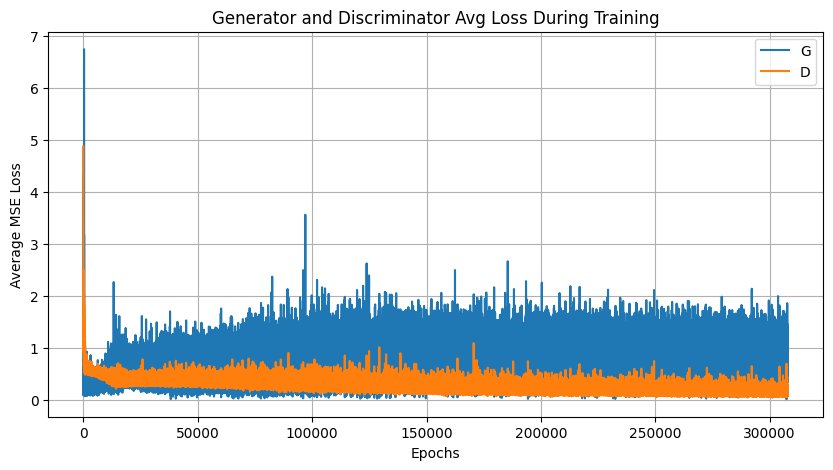

📉 Loss curve plot saved/shown (based on 308000 epochs).

Loading final Generator model and fixed preview data...
Loaded fixed_noise shape: torch.Size([16, 100])
Loaded fixed_fmri_condition shape: torch.Size([16, 1024])
Loaded real_images_for_preview shape: torch.Size([16, 3, 64, 64])
Generator loaded successfully.
Generating fake images for comparison...
Plotting Real vs. Final Fake images...
📊 Real vs. Fake comparison plot saved/shown.


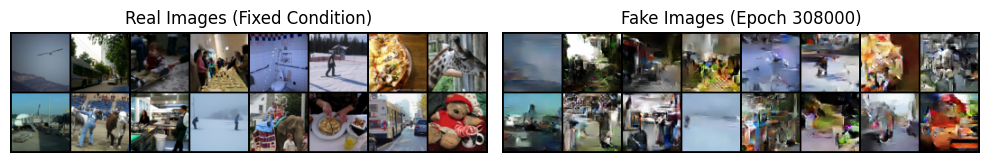

In [ ]:
# Check device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

if not os.path.exists(OUTPUT_BASE_DIR):
    print(f"ERROR: Output directory {OUTPUT_BASE_DIR} not found. Cannot visualize results.")
else:
    print("Loading and plotting loss curves...")
    try:
        g_losses_loaded = np.load(LOSS_CURVE_G_PATH)
        d_losses_loaded = np.load(LOSS_CURVE_D_PATH)
        epochs_run = len(g_losses_loaded)

        plt.figure(figsize=(10,5))
        plt.title("Generator and Discriminator Avg Loss During Training")
        plt.plot(range(1, epochs_run + 1), g_losses_loaded, label="G")
        plt.plot(range(1, epochs_run + 1), d_losses_loaded, label="D")
        plt.xlabel("Epochs")
        plt.ylabel("Average MSE Loss")
        plt.legend()
        plt.grid(True)
        plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'loss_curve_epochs_loaded.png'))
        plt.show()
        print(f"📉 Loss curve plot saved/shown (based on {epochs_run} epochs).")
    except FileNotFoundError:
        print("Loss curve files (.npy) not found. Skipping plot.")
    except Exception as e:
        print(f"Error plotting loss curves: {e}")

    print("\nLoading final Generator model and fixed preview data...")
    fixed_noise = None
    fixed_fmri_condition = None
    real_images_for_preview = None
    netG_loaded = None

    try:
        # Load fixed data first
        if os.path.exists(FIXED_NOISE_PATH):
            fixed_noise = torch.load(FIXED_NOISE_PATH, map_location=device) # Load directly to device
            print(f"Loaded fixed_noise shape: {fixed_noise.shape}")
        else:
            print(f"Warning: Saved fixed noise not found at {FIXED_NOISE_PATH}")

        if os.path.exists(FIXED_FMRI_PATH):
            fixed_fmri_condition = torch.load(FIXED_FMRI_PATH, map_location=device) # Load directly to device
            print(f"Loaded fixed_fmri_condition shape: {fixed_fmri_condition.shape}")
        else:
            print(f"Warning: Saved fixed fmri condition not found at {FIXED_FMRI_PATH}")

        if os.path.exists(REAL_IMAGES_PREVIEW_PATH):
             real_images_for_preview = torch.load(REAL_IMAGES_PREVIEW_PATH, map_location='cpu') # Keep real images on CPU
             print(f"Loaded real_images_for_preview shape: {real_images_for_preview.shape}")
        else:
            print(f"Warning: Saved real images tensor not found at {REAL_IMAGES_PREVIEW_PATH}")

        netG_loaded = Generator().to(device)
        netG_loaded.load_state_dict(torch.load(FINAL_CKPT_G_PATH, map_location=device))
        netG_loaded.eval()
        print("Generator loaded successfully.")

        # --- Generate and Plot ---
        if netG_loaded is not None and fixed_noise is not None and fixed_fmri_condition is not None and real_images_for_preview is not None:
            print("Generating fake images for comparison...")
            with torch.no_grad():
                fake_preview = netG_loaded(fixed_noise, fixed_fmri_condition).detach().cpu()

            print("Plotting Real vs. Final Fake images...")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))

            axes[0].axis("off")
            axes[0].set_title("Real Images (Fixed Condition)")
            axes[0].imshow(np.transpose(vutils.make_grid(real_images_for_preview.to('cpu'), # Ensure on CPU
                                                          padding=2, normalize=True).cpu(),(1,2,0)))

            axes[1].axis("off")
            axes[1].set_title(f"Fake Images (Epoch {epochs_run})") # Use loaded epoch count
            axes[1].imshow(np.transpose(vutils.make_grid(fake_preview, padding=2, normalize=True).cpu(),(1,2,0)))

            plt.tight_layout()
            plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'real_vs_fake_final_comparison_loaded.png'))
            print("📊 Real vs. Fake comparison plot saved/shown.")
            plt.show()
        else:
             print("Skipping Real vs Fake plot due to missing loaded components (model or fixed data).")

    except FileNotFoundError as e:
        print(f"Error: Required file not found: {e}. Skipping relevant visualization part.")
    except NameError as e:
         print(f"Error loading model/data: {e}. Ensure relevant definition cells were run.")
    except Exception as e:
        print(f"An error occurred during model loading or image generation: {e}")

In [ ]:
# Assuming PREVIEW_DIR_CDCGAN is defined as in the provided code
PREVIEW_DIR_CDCGAN = '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews'
OUTPUT_BASE_DIR = '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024'

# Find preview files and sort them in descending order
preview_files = sorted(glob.glob(os.path.join(PREVIEW_DIR_CDCGAN, 'preview_epoch_*.png')))
preview_files.sort(key=lambda f: int(re.search(r'preview_epoch_(\d+).png', f).group(1)))
print(preview_files)

if preview_files:
    gif_path = os.path.join(OUTPUT_BASE_DIR, 'training_progress_generation.gif')
    print(f"Creating GIF (saving to {gif_path})...")

    with imageio.get_writer(gif_path, mode='I', duration=0.5, loop=0) as writer:
        for filename in preview_files:
            image = imageio.v2.imread(filename)
            writer.append_data(image)
    print("GIF creation complete.")
else:
    print("No preview image files found in specified directory. Skipping GIF creation.")


['/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_20.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_40.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_60.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_80.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_100.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_120.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_140.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_160.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_180.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_200.png', '/content/drive/MyDrive/DNN experiments/pca512SNGAN1024/previews/preview_epoch_220.png', '/content/drive/MyDrive/

##Example questions you can ask:**

1. (Changes of the model at least 1) Does adding more layer to BrainDecoder improve the result? The quality? Or adding Convolutional layers? Or trying different loss function? Doing PCA before?
2. Is the reconstruction better if we use brain activtity from region V1d (which is purely visual) or EBA which is related to places (X vs Y, two different regions)
3. Compare different subject? Subj 1 vs Subj 2
4. Choose categories of images (Cities vs Nature)
5. Can try to generate a text description of the image (advanced)
6. Classification: generate some labels from the images (using ResNet), you use you latent code to train a classifier
7. Sentiment